<p style="align: center;"><img src="https://static.tildacdn.com/tild6636-3531-4239-b465-376364646465/Deep_Learning_School.png" width="400"></p>

# Домашнее задание. Обучение языковой модели с помощью LSTM (10 баллов)

Э
В этом задании Вам предстоит обучить языковую модель с помощью рекуррентной нейронной сети. В отличие от семинарского занятия, Вам необходимо будет работать с отдельными словами, а не буквами.


Установим модуль ```datasets```, чтобы нам проще было работать с данными.

Импорт необходимых библиотек

In [35]:
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torch.optim.lr_scheduler import CosineAnnealingLR

import numpy as np
import matplotlib.pyplot as plt

from tqdm.auto import tqdm
from datasets import load_dataset
from nltk.tokenize import sent_tokenize, word_tokenize
from sklearn.model_selection import train_test_split
import nltk
from tqdm.notebook import tqdm, trange
from einops import rearrange

from collections import Counter, OrderedDict
from typing import List

import seaborn
seaborn.set(palette='summer')

In [2]:
nltk.download('punkt')

[nltk_data] Downloading package punkt to /home/jupyter/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [3]:
nltk.download('punkt_tab')

[nltk_data] Downloading package punkt_tab to
[nltk_data]     /home/jupyter/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


True

In [4]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
device

'cuda'

## Подготовка данных

Воспользуемся датасетом imdb. В нем хранятся отзывы о фильмах с сайта imdb. Загрузим данные с помощью функции ```load_dataset```

In [5]:
# Загрузим датасет
dataset = load_dataset('imdb')

### Препроцессинг данных и создание словаря (1 балл)

Далее вам необходмо самостоятельно произвести препроцессинг данных и получить словарь или же просто ```set``` строк. Что необходимо сделать:

1. Разделить отдельные тренировочные примеры на отдельные предложения с помощью функции ```sent_tokenize``` из бибилиотеки ```nltk```. Каждое отдельное предложение будет одним тренировочным примером.
2. Оставить только те предложения, в которых меньше ```word_threshold``` слов.
3. Посчитать частоту вхождения каждого слова в оставшихся предложениях. Для деления предлоения на отдельные слова удобно использовать функцию ```word_tokenize```.
4. Создать объект ```vocab``` класса ```set```, положить в него служебные токены '\<unk\>', '\<bos\>', '\<eos\>', '\<pad\>' и vocab_size самых частовстречающихся слов.   

In [6]:
def tokenize_text(text, treshold):
    if isinstance(text, List):
        text = " ".join(text)

    text = sent_tokenize(text)

    result = []

    for sent in text:
        if len(word_tokenize(sent)) <= treshold:
            result.append(sent)
    return result

In [ ]:
word_threshold = 32
sentences = []
for sample in ('train', 'test', 'unsupervised'):
    sentences += tokenize_text(dataset[sample]['text'], word_threshold)

# Получить отдельные предложения и поместить их в sentences

In [ ]:
print("Всего предложений:", len(sentences))

Всего предложений: 783087


Посчитаем для каждого слова его встречаемость.

In [ ]:
words = Counter()

for sent in sentences:
    words.update(word_tokenize(sent))

In [ ]:
words.most_common(3)

[('.', 681997), ('the', 517989), (',', 468360)]

Добавим в словарь ```vocab_size``` самых встречающихся слов.

In [ ]:
vocab = set()
vocab_size = 40000

# Наполнение словаря
for word in words.most_common(vocab_size):
    vocab.update([word[0]])

special_tokens = ['<unk>', '<bos>', '<eos>', '<pad>']
vocab.update(special_tokens)

In [ ]:
assert '<unk>' in vocab
assert '<bos>' in vocab
assert '<eos>' in vocab
assert '<pad>' in vocab
assert len(vocab) == vocab_size + 4

In [ ]:
print("Всего слов в словаре:", len(vocab))

Всего слов в словаре: 40004


### Подготовка датасета (1 балл)

Далее, как и в семинарском занятии, подготовим датасеты и даталоадеры.

В классе ```WordDataset``` вам необходимо реализовать метод ```__getitem__```, который будет возвращать сэмпл данных по входному idx, то есть список целых чисел (индексов слов).

Внутри этого метода необходимо добавить служебные токены начала и конца последовательности, а также токенизировать соответствующее предложение с помощью ```word_tokenize``` и сопоставить ему индексы из ```word2ind```.

In [ ]:
word2ind = {char: i for i, char in enumerate(vocab)}
ind2word = {i: char for char, i in word2ind.items()}

In [ ]:
class WordDataset:
    def __init__(self, sentences):
        self.data = sentences
        self.unk_id = word2ind['<unk>']
        self.bos_id = word2ind['<bos>']
        self.eos_id = word2ind['<eos>']
        self.pad_id = word2ind['<pad>']

    def __getitem__(self, idx: int) -> List[int]:
        tokenized_sentence = [self.bos_id]
        sent = self.data[idx]
        for word in word_tokenize(sent):
            if word in word2ind:
                tokenized_sentence.append(word2ind[word])
            else:
                tokenized_sentence.append(self.unk_id)
        tokenized_sentence.append(self.eos_id)

        return tokenized_sentence

    def __len__(self) -> int:
        return len(self.data)

In [ ]:
def collate_fn_with_padding(
    input_batch: List[List[int]], pad_id=word2ind['<pad>']) -> torch.Tensor:
    seq_lens = [len(x) for x in input_batch]
    max_seq_len = max(seq_lens)

    new_batch = []
    for sequence in input_batch:
        for _ in range(max_seq_len - len(sequence)):
            sequence.append(pad_id)
        new_batch.append(sequence)

    sequences = torch.LongTensor(new_batch).to(device)

    new_batch = {
        'input_ids': sequences[:,:-1],
        'target_ids': sequences[:,1:]
    }

    return new_batch

In [ ]:
train_sentences, eval_sentences = train_test_split(sentences, test_size=0.2)
eval_sentences, test_sentences = train_test_split(sentences, test_size=0.5)

train_dataset = WordDataset(train_sentences)
eval_dataset = WordDataset(eval_sentences)
test_dataset = WordDataset(test_sentences)

batch_size = 128

train_dataloader = DataLoader(
    train_dataset, collate_fn=collate_fn_with_padding, batch_size=batch_size)

eval_dataloader = DataLoader(
    eval_dataset, collate_fn=collate_fn_with_padding, batch_size=batch_size)

test_dataloader = DataLoader(
    test_dataset, collate_fn=collate_fn_with_padding, batch_size=batch_size)

## Обучение и архитектура модели

Вам необходимо на практике проверить, что влияет на качество языковых моделей. В этом задании нужно провести серию экспериментов с различными вариантами языковых моделей и сравнить различия в конечной перплексии на тестовом множестве.

Возмоэные идеи для экспериментов:

* Различные RNN-блоки, например, LSTM или GRU. Также можно добавить сразу несколько RNN блоков друг над другом с помощью аргумента num_layers. Вам поможет официальная документация [здесь](https://pytorch.org/docs/stable/generated/torch.nn.LSTM.html)
* Различные размеры скрытого состояния. Различное количество линейных слоев после RNN-блока. Различные функции активации.
* Добавление нормализаций в виде Dropout, BatchNorm или LayerNorm
* Различные аргументы для оптимизации, например, подбор оптимального learning rate или тип алгоритма оптимизации SGD, Adam, RMSProp и другие
* Любые другие идеи и подходы

После проведения экспериментов необходимо составить таблицу результатов, в которой описан каждый эксперимент и посчитана перплексия на тестовом множестве.

Учтите, что эксперименты, которые различаются, например, только размером скрытого состояния или количеством линейных слоев считаются, как один эксперимент.

Успехов!

### Функция evaluate (1 балл)

Заполните функцию ```evaluate```

In [83]:
def evaluate(model, criterion, dataloader) -> float:
    model.eval()
    perplexity = []
    with torch.no_grad():
        for batch in dataloader:
            logits = model(batch['input_ids'])
            logits = rearrange(logits, 'a b c->(a b) c')
            loss = criterion(logits, batch['target_ids'].flatten())
            perplexity.append(torch.exp(loss).item())

    perplexity = sum(perplexity) / len(perplexity)

    return perplexity

### Train loop (1 балл)

Напишите функцию для обучения модели.

In [196]:
import plotly.graph_objs as go
import plotly.subplots as sp
from IPython.display import clear_output

def plot_two_graphs(losses, lr_s):
    """
    Функция для отрисовки двух графиков с использованием Seaborn.

    :param array1: Данные для первого графика (значения потерь)
    """
    fig = plt.gcf()
    # Если нет — обнуляем фигуру и создаём в ней два подграфика
    if len(fig.axes) < 2:
        fig.clf()                                 # очистка всей фигуры
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,5))
    else:
        # Если нужно только перерисовать старые
        ax1, ax2 = fig.axes

    # Очищаем предыдущий контент на осях
    ax1.cla()
    ax2.cla()

    # Создаём ось X для потерь и для LR
    epochs_loss = np.arange(len(losses))
    epochs_lr   = np.arange(len(lr_s))

    # Рисуем графики на уже существующих осях
    ax1.plot(epochs_loss, losses)
    ax1.set_title('Train loss')
    ax1.set_xlabel('num_steps')
    ax1.set_ylabel('Loss')

    ax2.plot(epochs_lr, lr_s)
    ax2.set_title('LR')
    ax2.set_xlabel('num_steps')
    ax2.set_ylabel('LR')

    # Немного подтягиваем оформление и выводим на экран
    plt.tight_layout()
    plt.show()

# Пример использования
# train_loss = [1.0, 0.8, 0.6, 0.4, 0.3]

# plot_two_graphs(train_loss)


In [197]:
def train_epoch(model, criterion, optimizer, dataloader, lr_scheduler, num_epoch, val_period=256):
    pbar = trange(len(dataloader), desc=f'Training epoch {num_epoch}', initial=0)
    losses = []
    lr = []
    model.train()
    for i, batch in enumerate(dataloader):
        input_ids, target_ids = batch['input_ids'], batch['target_ids']
        optimizer.zero_grad()
        logits = model(input_ids)
        logits = rearrange(logits, 'a b c->(a b) c')
        loss = criterion(logits, batch['target_ids'].flatten())

        loss.backward()
        optimizer.step()
        losses.append(loss.item())
        pbar.update()
        if i % val_period == 0:
             # Закрытие предыдущей фигуры
            plt.close()
            lr.append(scheduler.get_last_lr()[0])
            plot_two_graphs(losses, lr)
            scheduler.step()
    pbar.close()
    return sum(losses) / len(losses)


In [198]:
def train_model(model, criterion, optimizer, scheduler, num_epochs):
    pp_x = []
    for epoch in range(1, num_epochs+1):
        train_epoch(model, criterion, optimizer, train_dataloader, scheduler, epoch)
        pp_x.append(evaluate(model, criterion, eval_dataloader))
    return pp_x

### Первый эксперимент (2 балла)

Определите архитектуру модели и обучите её.

In [199]:
class LanguageModel(nn.Module):
    def __init__(self, vocab_size, emb_size, hidden_size, fc_size):
        super().__init__()
        self.vocab_size = vocab_size
        self.emb_size = emb_size
        self.hidden_size = hidden_size
        self.fc_size = fc_size

        self.emb = nn.Embedding(self.vocab_size, self.emb_size)
        self.LSTM = nn.LSTM(self.emb_size, self.hidden_size)
        # Опишите свою нейронную сеть здесь
        self.fc = nn.Sequential(OrderedDict([
            ('lin1', nn.Linear(self.hidden_size, self.fc_size)),
            ('activation', nn.ReLU()),
            ('lin2', nn.Linear(self.fc_size, self.vocab_size))
        ]))
    def forward(self, input_batch: torch.Tensor) -> torch.Tensor:
        # А тут опишите forward pass модели
        embeds = self.emb(input_batch)
        features = self.LSTM(embeds)[0]

        result = self.fc(features)
        return result

In [200]:
# Обучите модель здесь

model = LanguageModel(len(vocab), 300, 300, 600).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
criterion = nn.CrossEntropyLoss(ignore_index=word2ind['<pad>'])
scheduler = CosineAnnealingLR(optimizer, T_max=1000)

Training epoch 1:   0%|          | 0/4895 [00:00<?, ?it/s]

<Figure size 640x480 with 0 Axes>

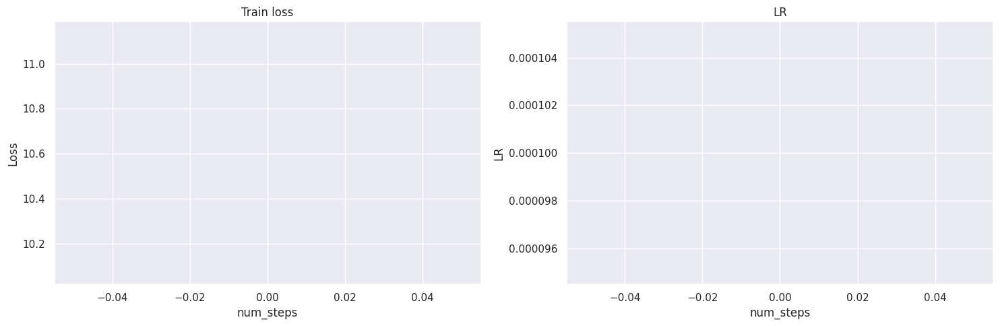

<Figure size 640x480 with 0 Axes>

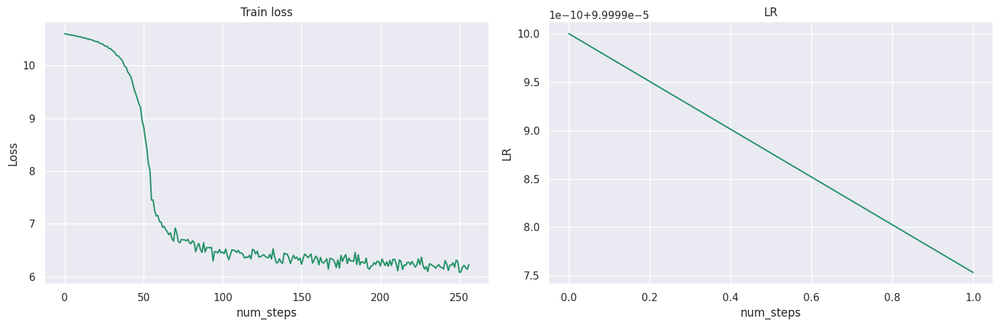

<Figure size 640x480 with 0 Axes>

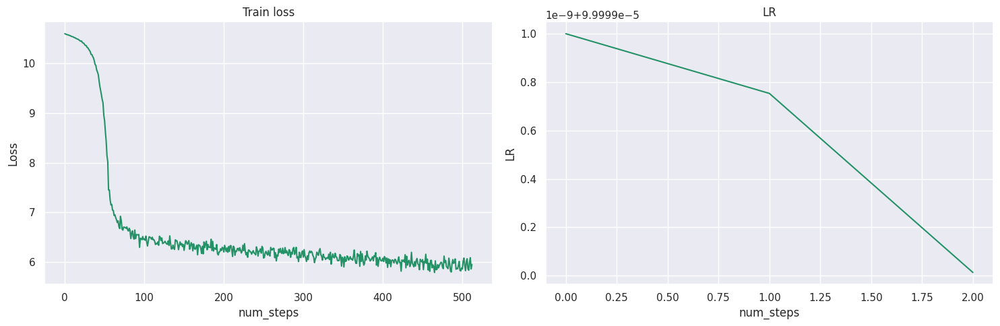

<Figure size 640x480 with 0 Axes>

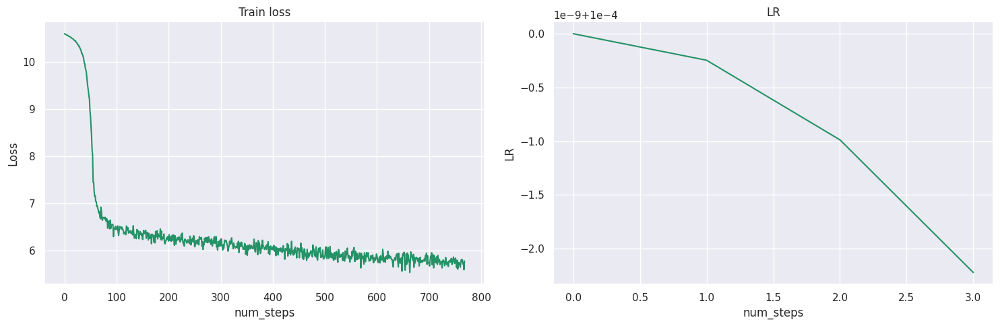

<Figure size 640x480 with 0 Axes>

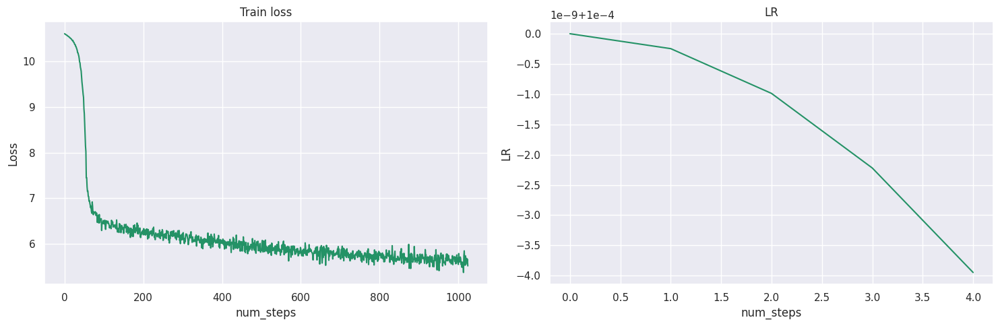

<Figure size 640x480 with 0 Axes>

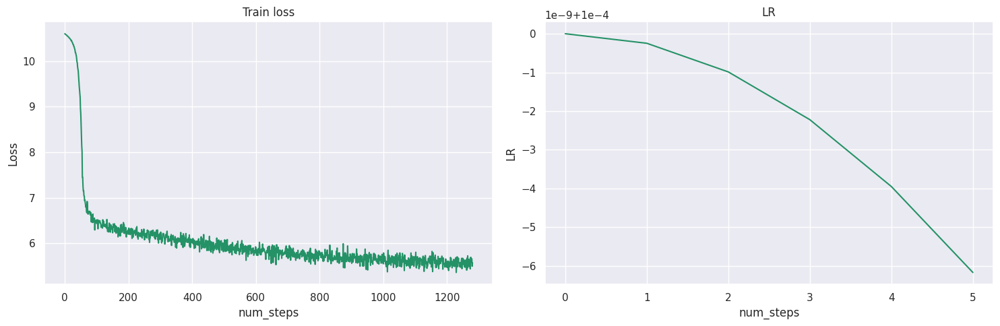

<Figure size 640x480 with 0 Axes>

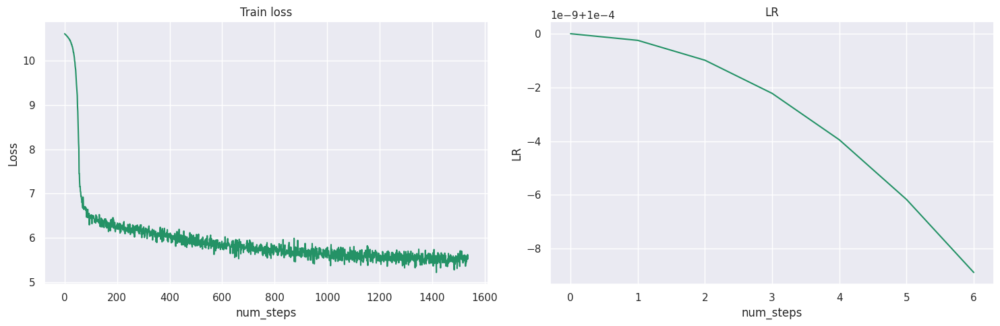

<Figure size 640x480 with 0 Axes>

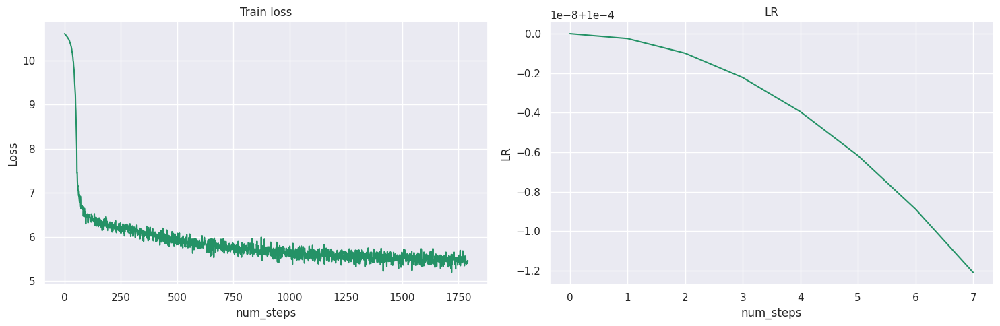

<Figure size 640x480 with 0 Axes>

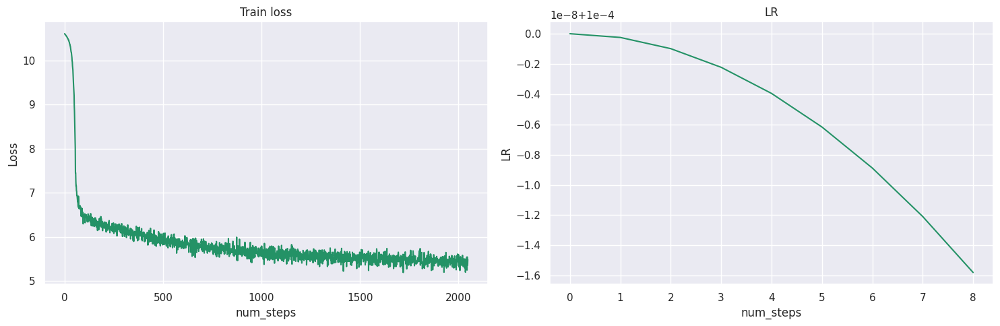

<Figure size 640x480 with 0 Axes>

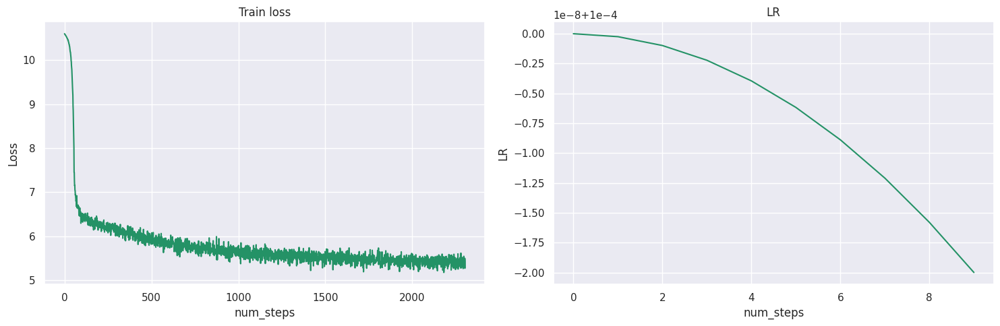

<Figure size 640x480 with 0 Axes>

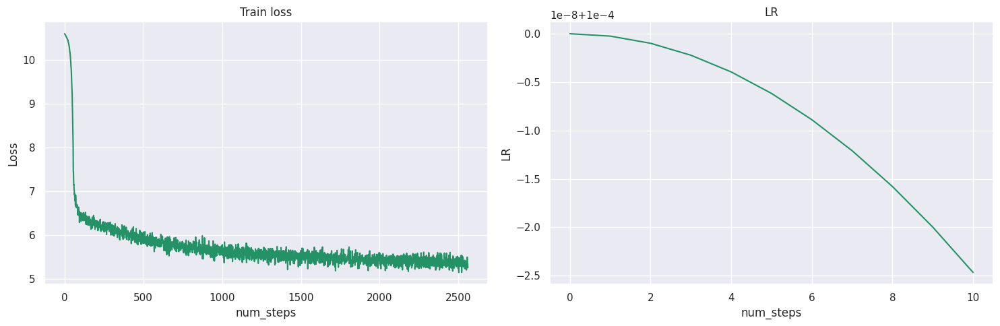

<Figure size 640x480 with 0 Axes>

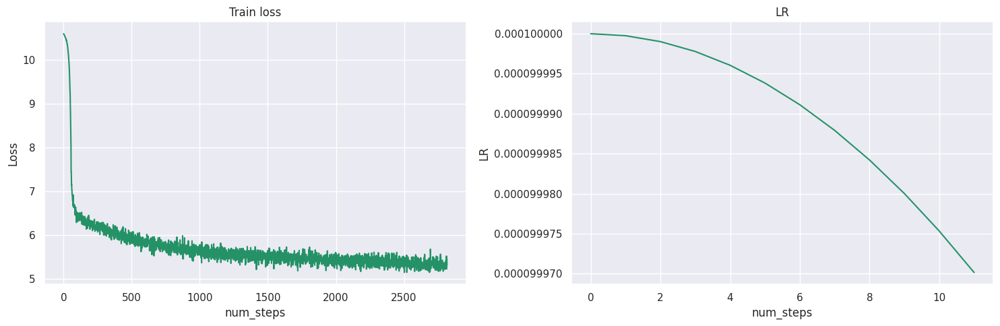

<Figure size 640x480 with 0 Axes>

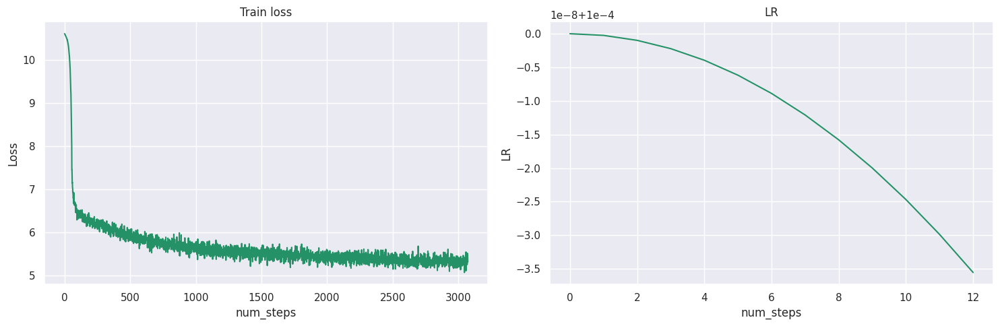

<Figure size 640x480 with 0 Axes>

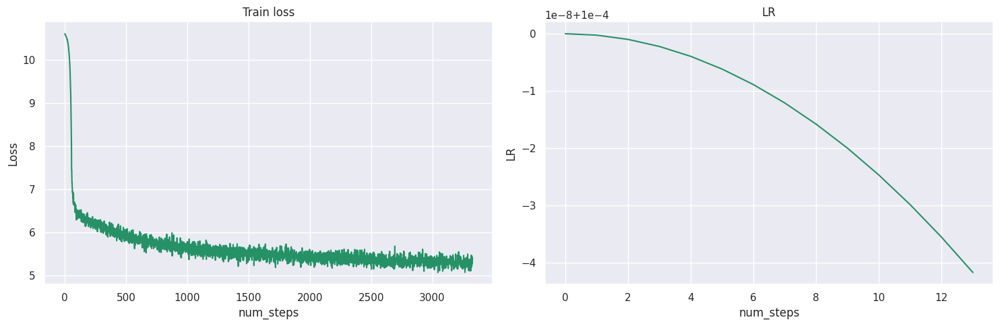

<Figure size 640x480 with 0 Axes>

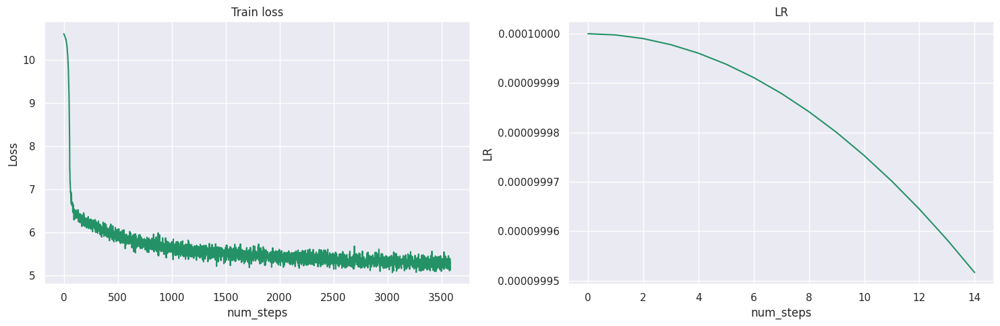

<Figure size 640x480 with 0 Axes>

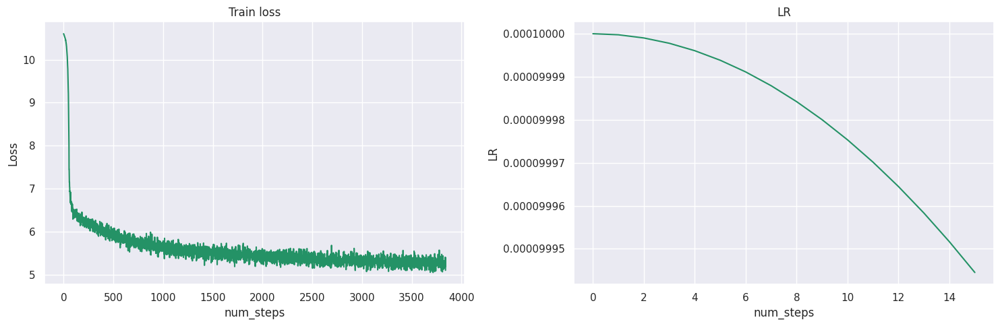

<Figure size 640x480 with 0 Axes>

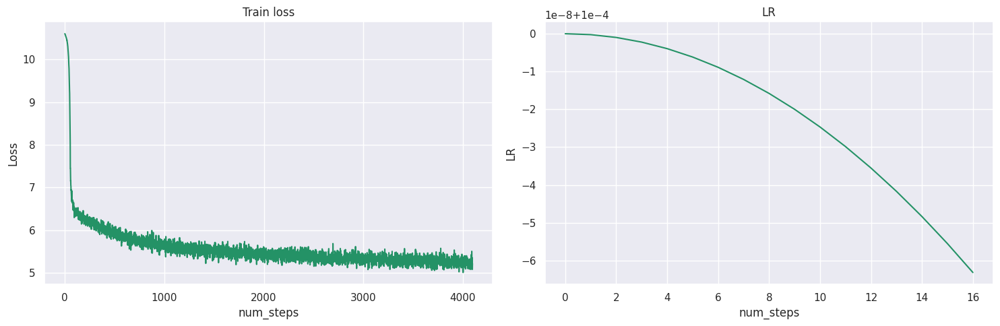

<Figure size 640x480 with 0 Axes>

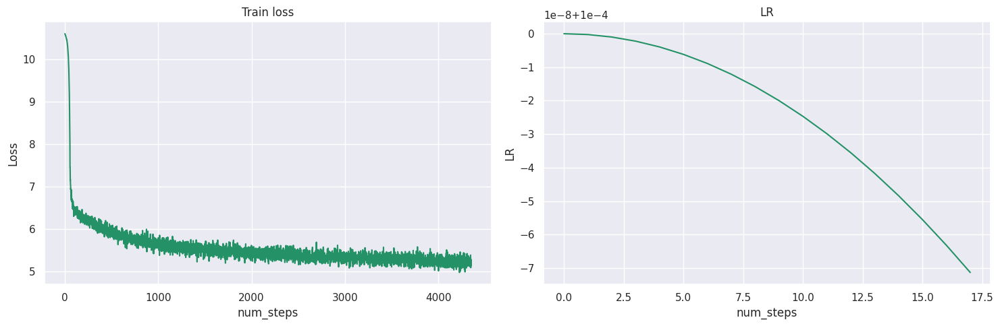

<Figure size 640x480 with 0 Axes>

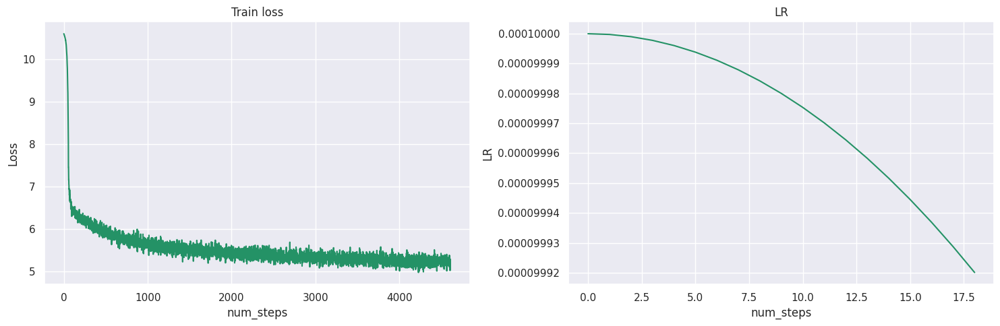

<Figure size 640x480 with 0 Axes>

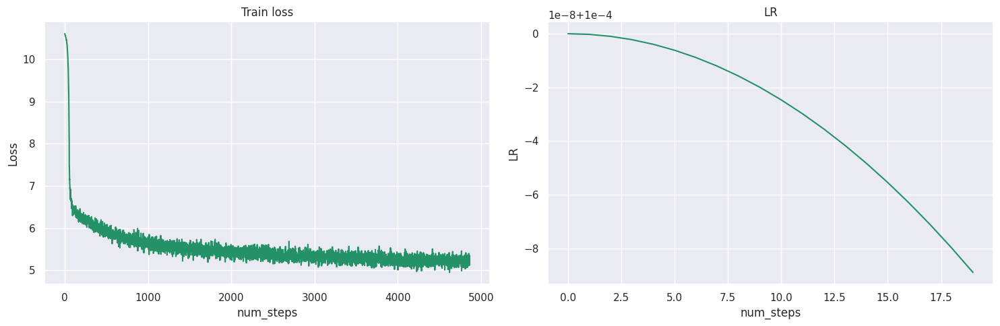

Training epoch 2:   0%|          | 0/4895 [00:00<?, ?it/s]

<Figure size 640x480 with 0 Axes>

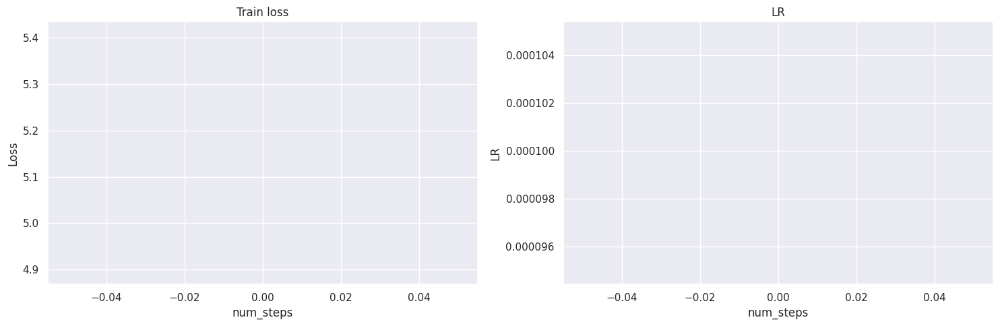

<Figure size 640x480 with 0 Axes>

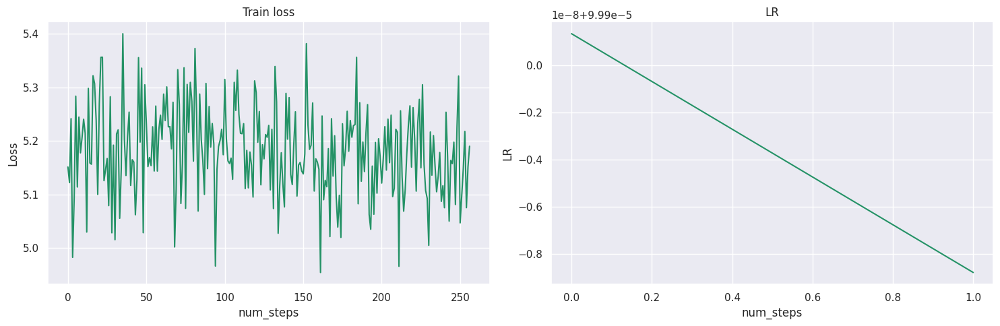

<Figure size 640x480 with 0 Axes>

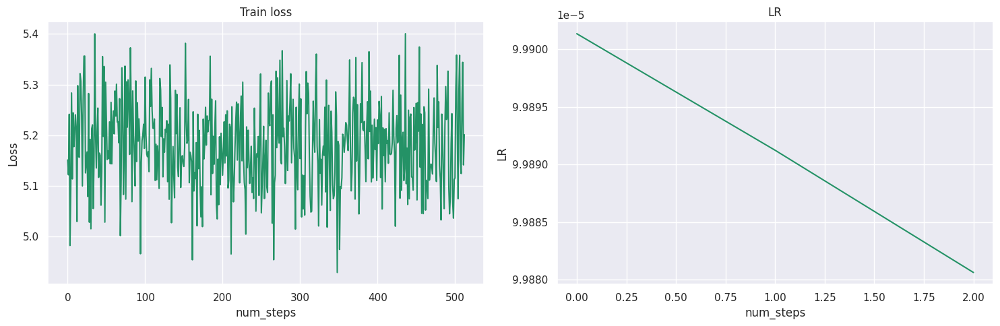

<Figure size 640x480 with 0 Axes>

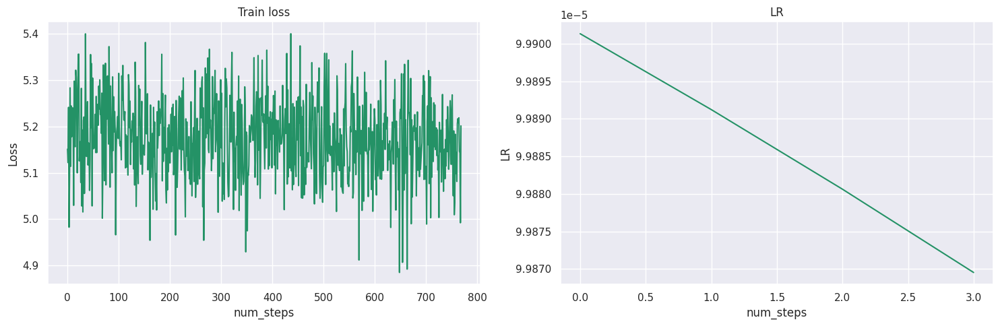

<Figure size 640x480 with 0 Axes>

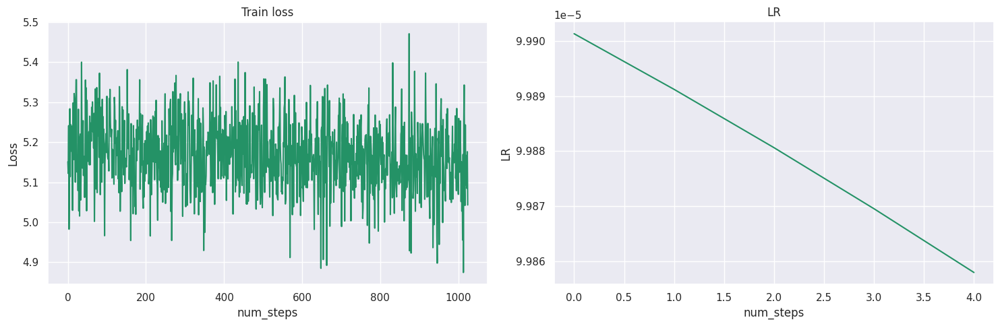

<Figure size 640x480 with 0 Axes>

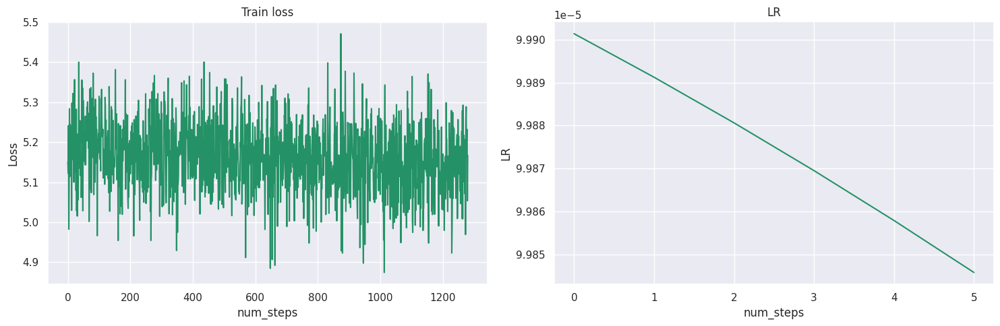

<Figure size 640x480 with 0 Axes>

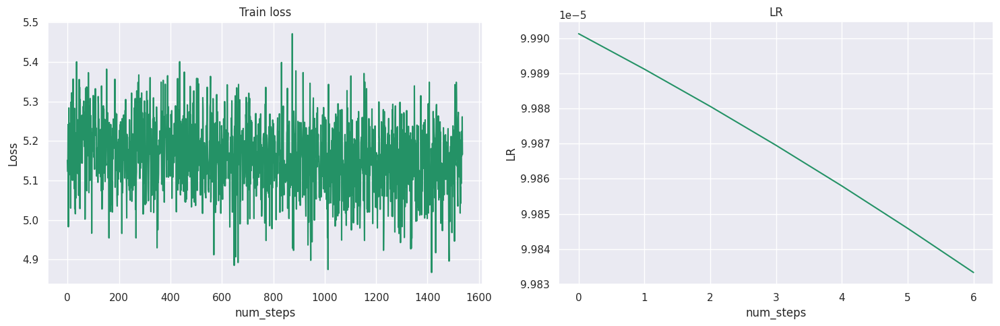

<Figure size 640x480 with 0 Axes>

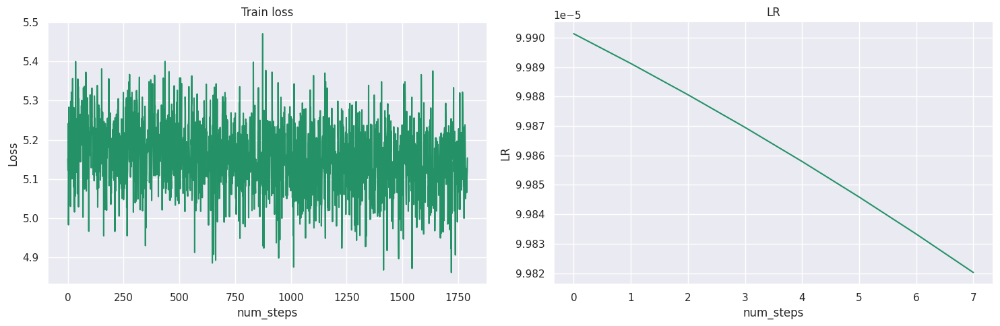

<Figure size 640x480 with 0 Axes>

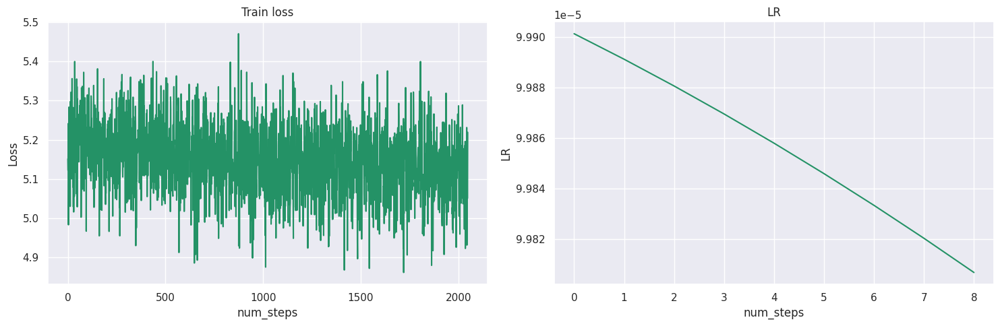

<Figure size 640x480 with 0 Axes>

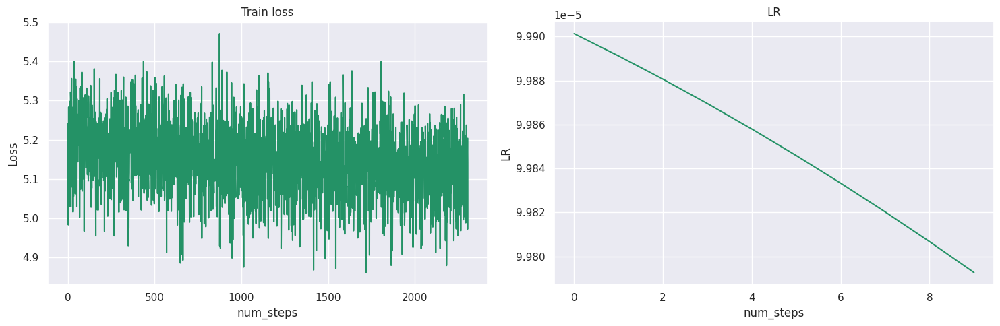

<Figure size 640x480 with 0 Axes>

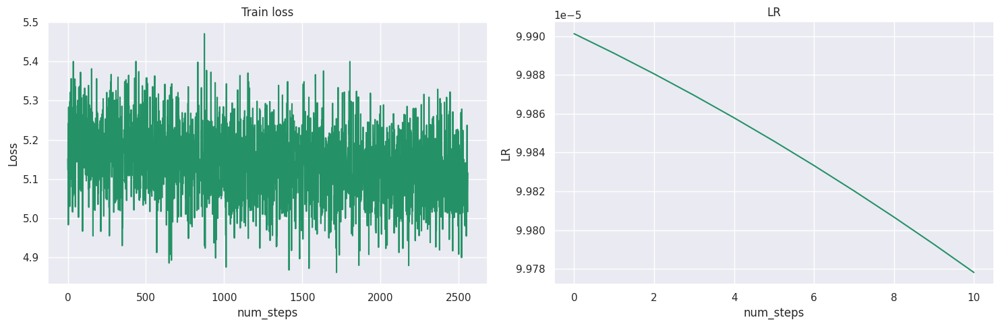

<Figure size 640x480 with 0 Axes>

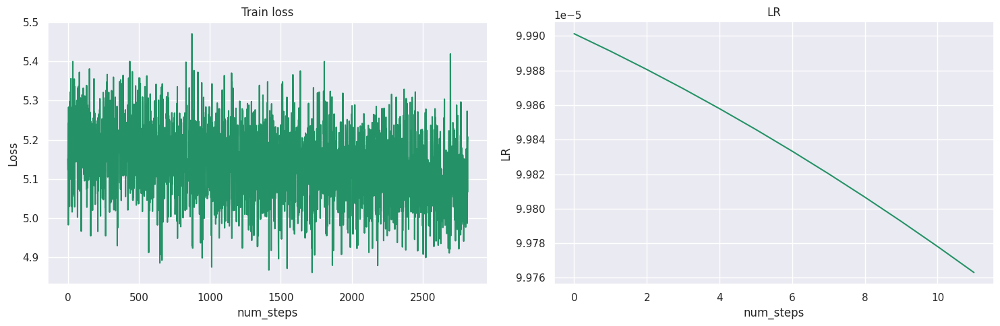

<Figure size 640x480 with 0 Axes>

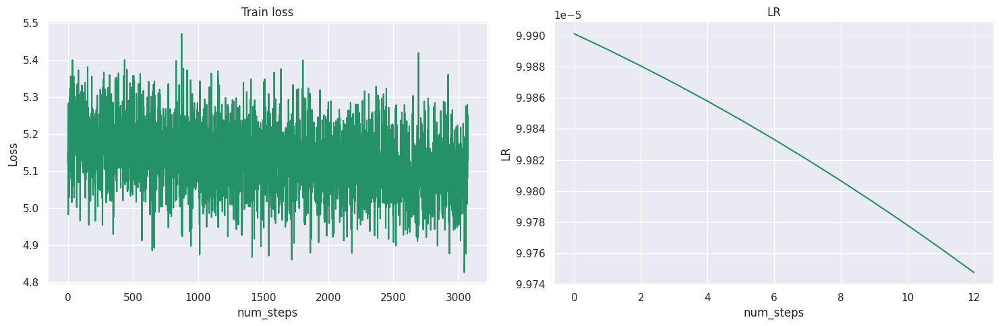

<Figure size 640x480 with 0 Axes>

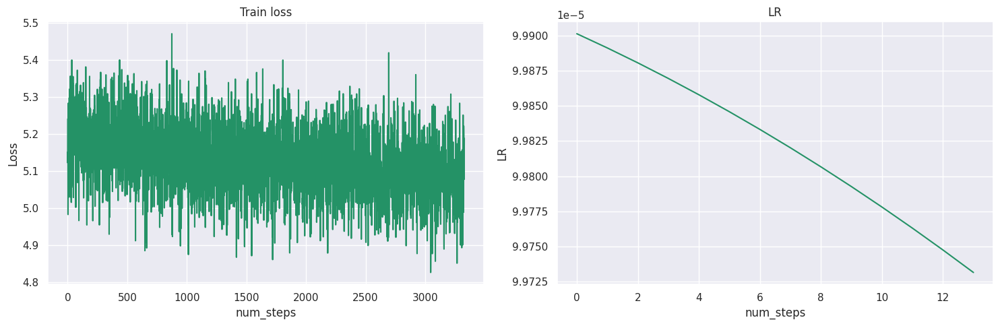

<Figure size 640x480 with 0 Axes>

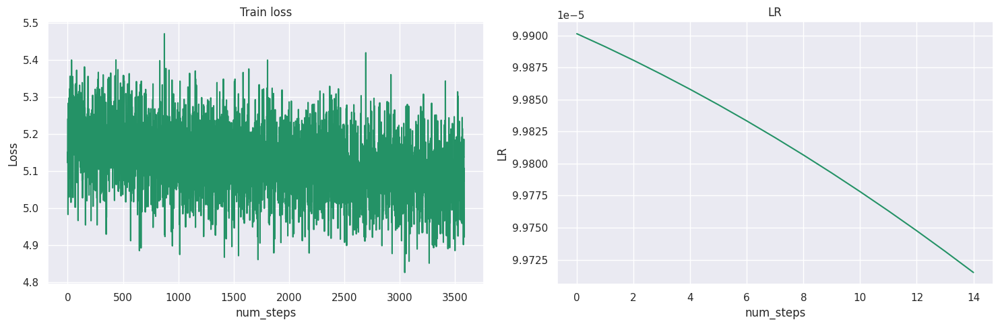

<Figure size 640x480 with 0 Axes>

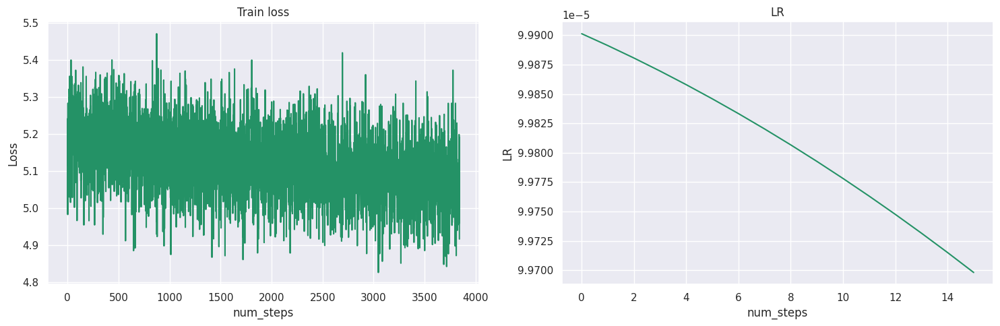

<Figure size 640x480 with 0 Axes>

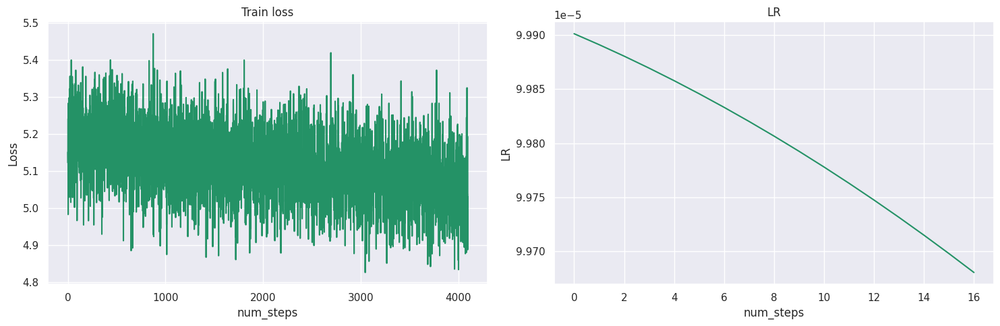

<Figure size 640x480 with 0 Axes>

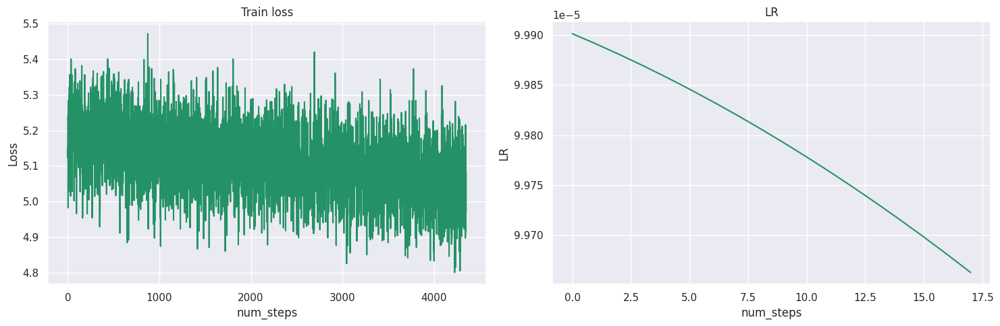

<Figure size 640x480 with 0 Axes>

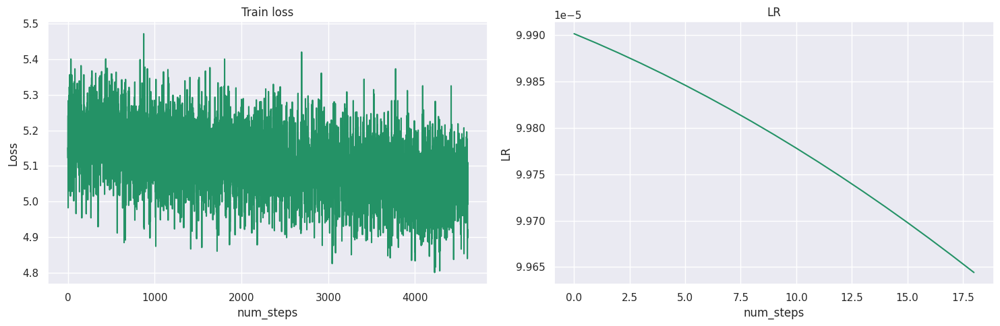

<Figure size 640x480 with 0 Axes>

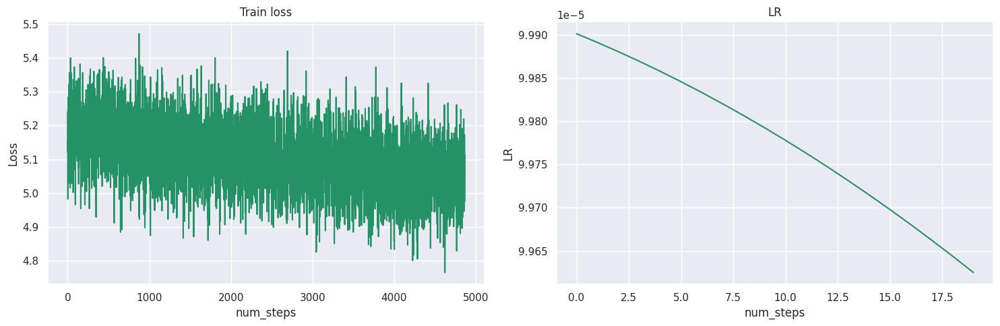

Training epoch 3:   0%|          | 0/4895 [00:00<?, ?it/s]

<Figure size 640x480 with 0 Axes>

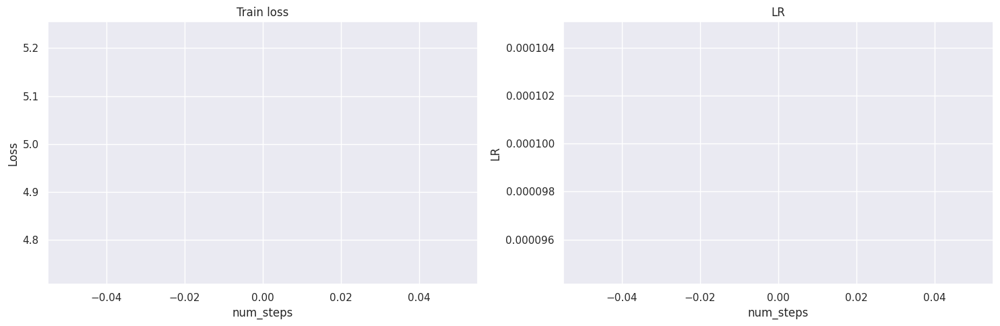

<Figure size 640x480 with 0 Axes>

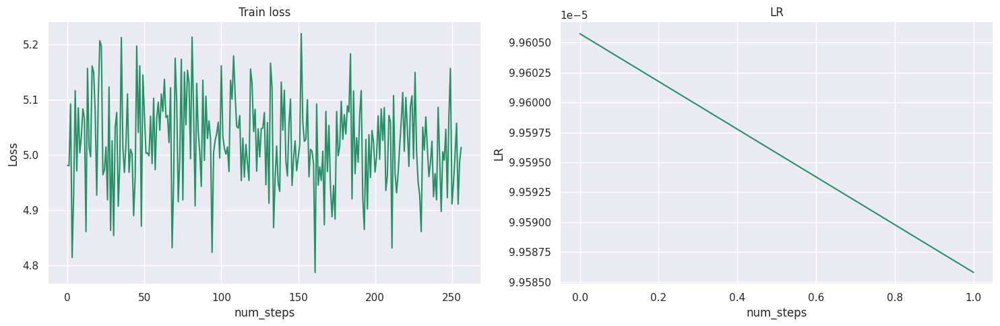

<Figure size 640x480 with 0 Axes>

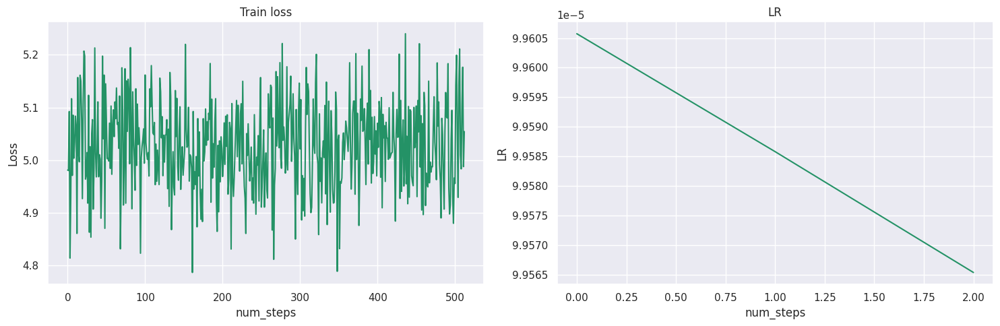

<Figure size 640x480 with 0 Axes>

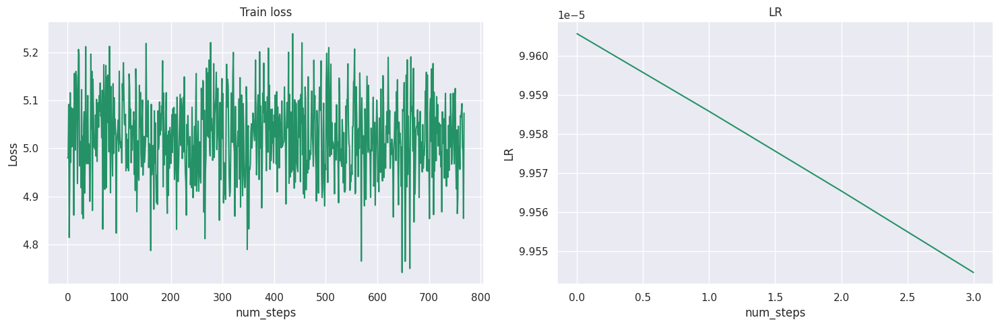

<Figure size 640x480 with 0 Axes>

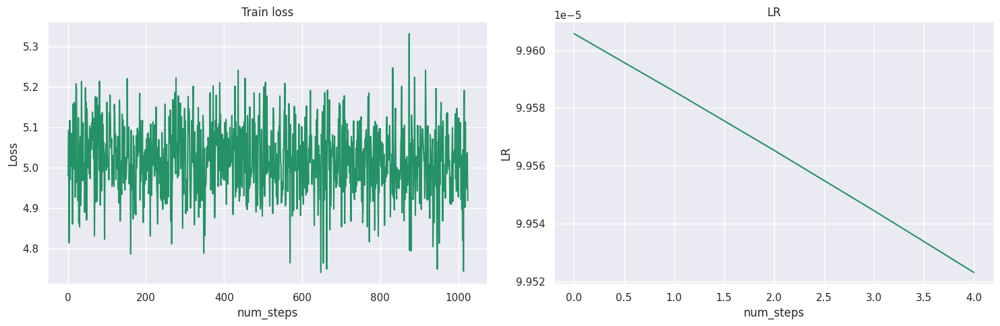

<Figure size 640x480 with 0 Axes>

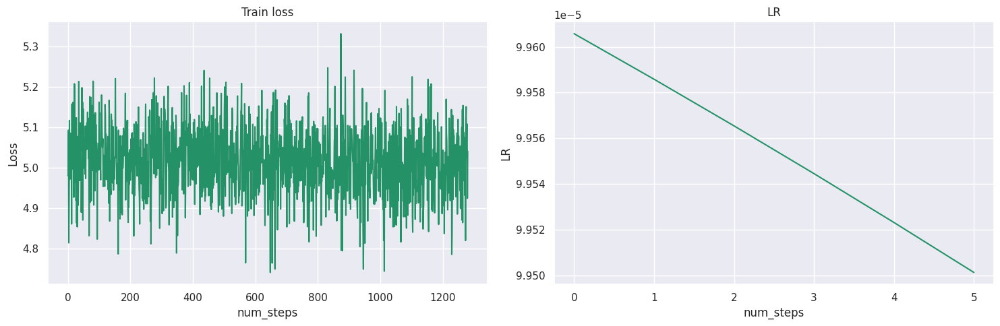

<Figure size 640x480 with 0 Axes>

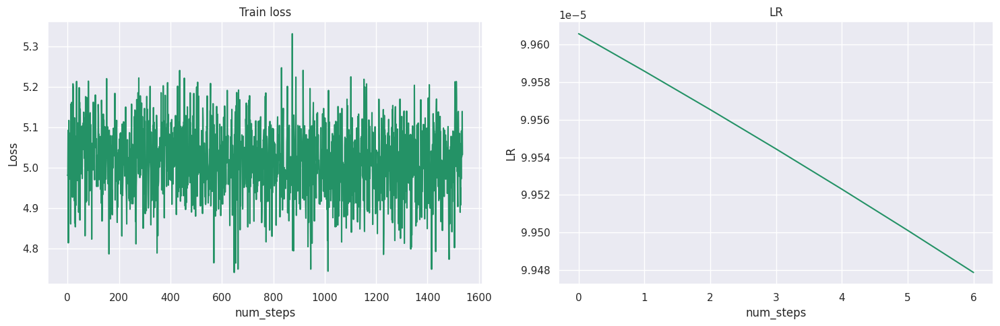

<Figure size 640x480 with 0 Axes>

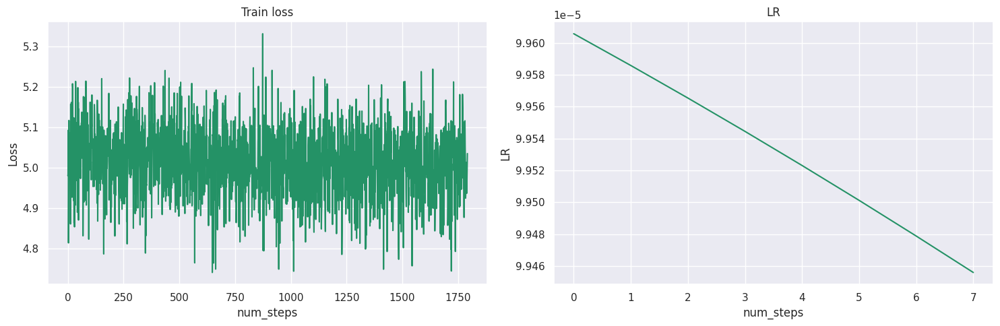

<Figure size 640x480 with 0 Axes>

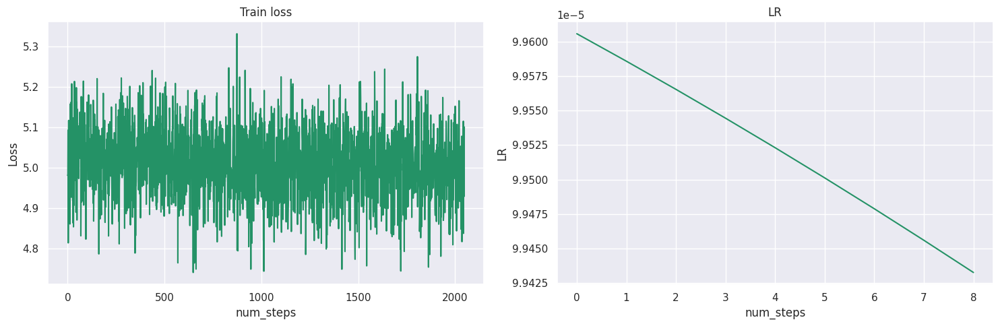

<Figure size 640x480 with 0 Axes>

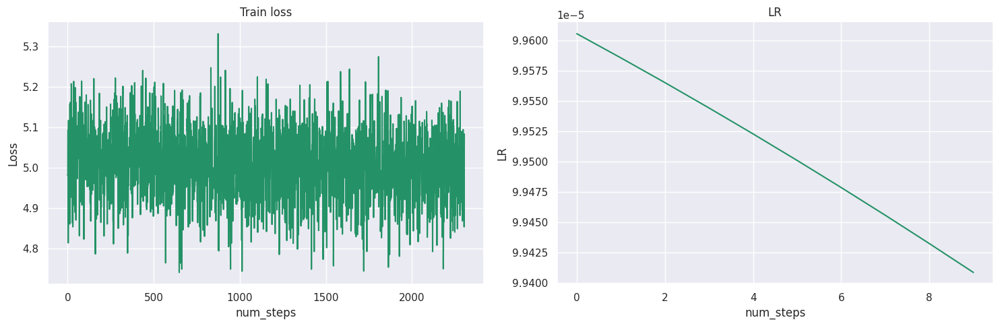

<Figure size 640x480 with 0 Axes>

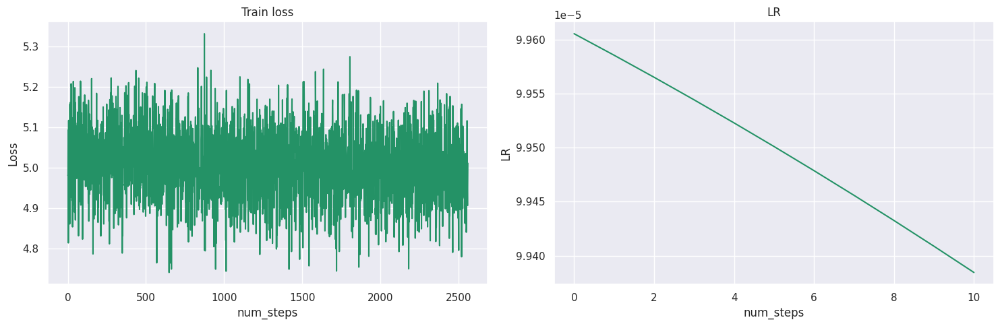

<Figure size 640x480 with 0 Axes>

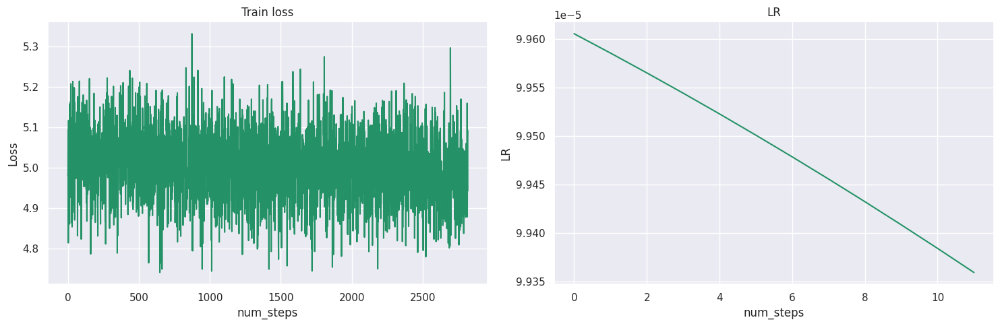

<Figure size 640x480 with 0 Axes>

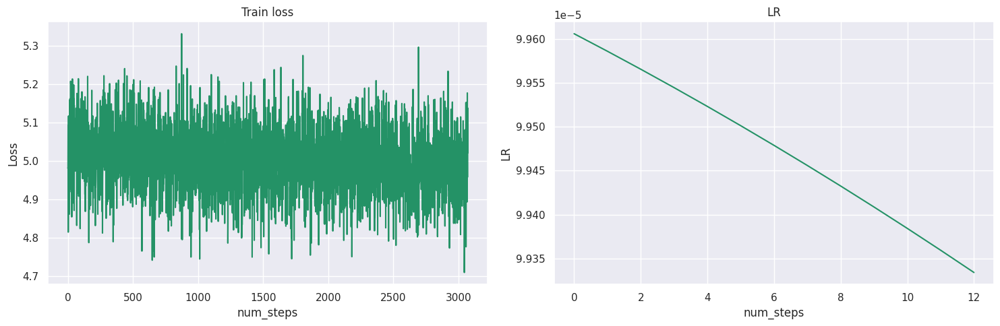

<Figure size 640x480 with 0 Axes>

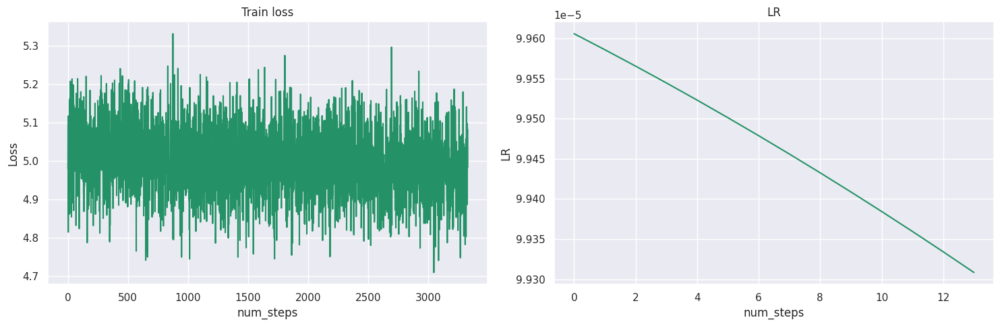

<Figure size 640x480 with 0 Axes>

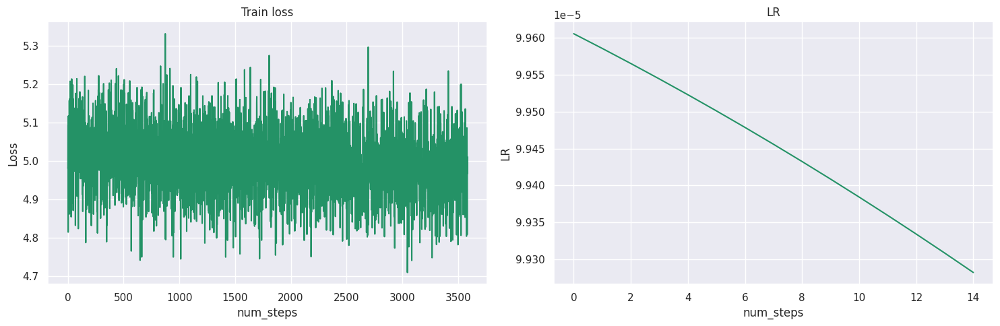

<Figure size 640x480 with 0 Axes>

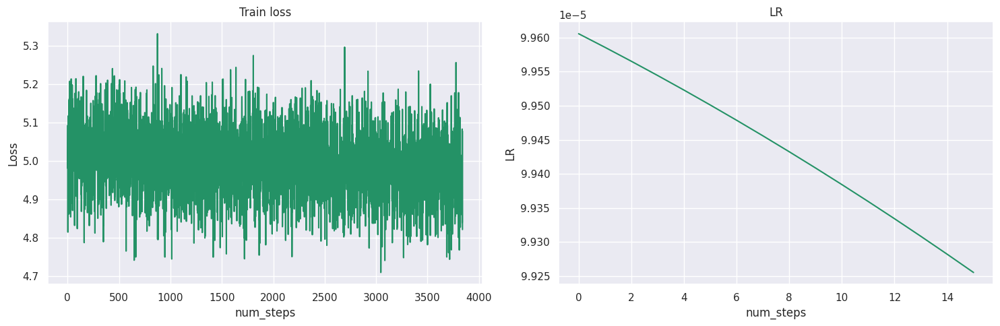

<Figure size 640x480 with 0 Axes>

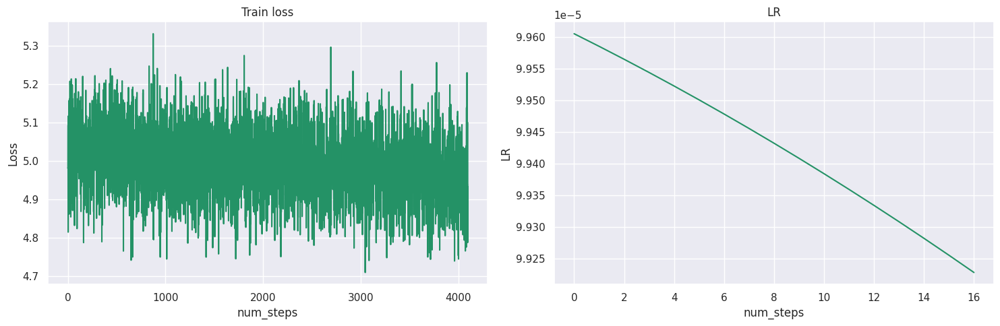

<Figure size 640x480 with 0 Axes>

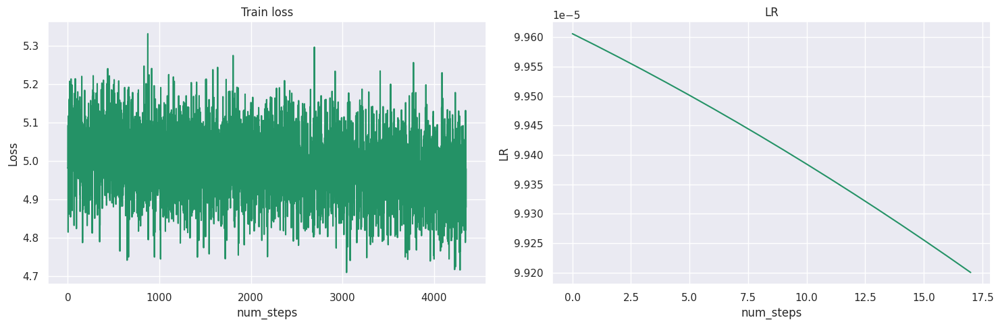

<Figure size 640x480 with 0 Axes>

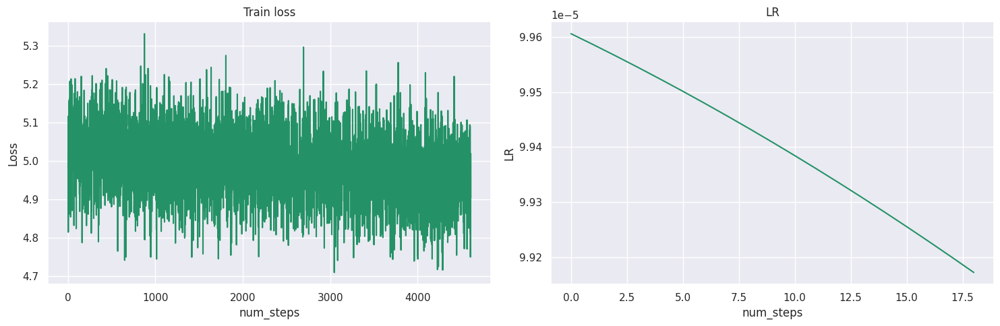

<Figure size 640x480 with 0 Axes>

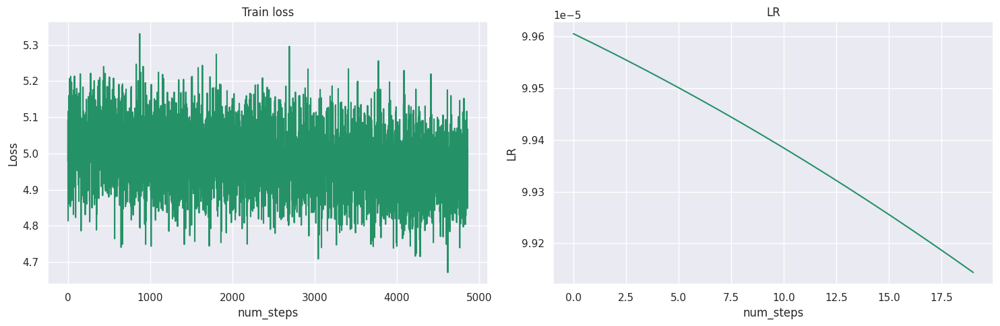

Training epoch 4:   0%|          | 0/4895 [00:00<?, ?it/s]

<Figure size 640x480 with 0 Axes>

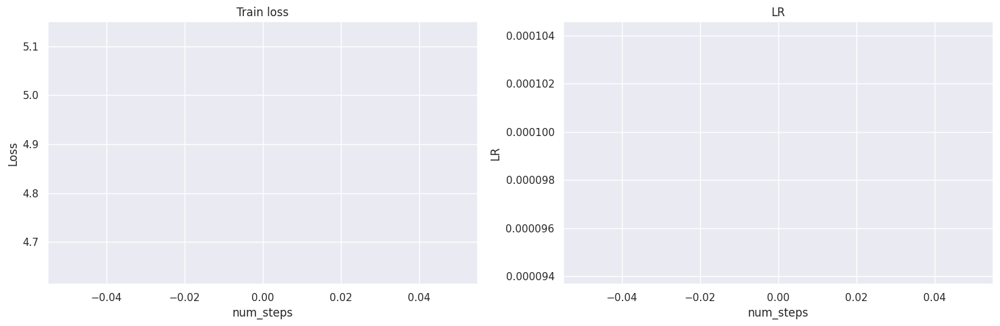

<Figure size 640x480 with 0 Axes>

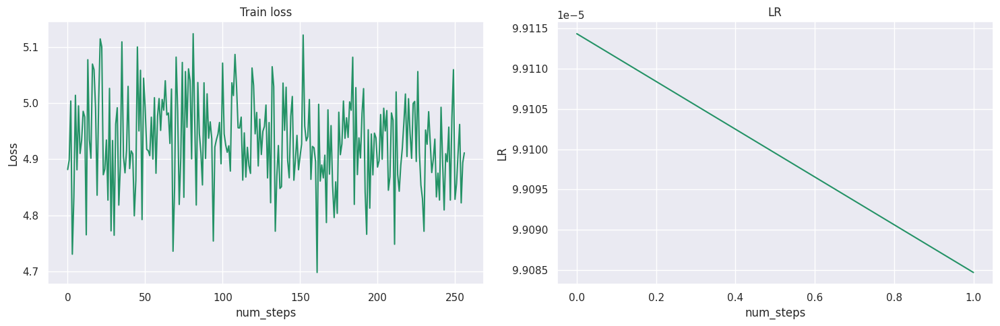

<Figure size 640x480 with 0 Axes>

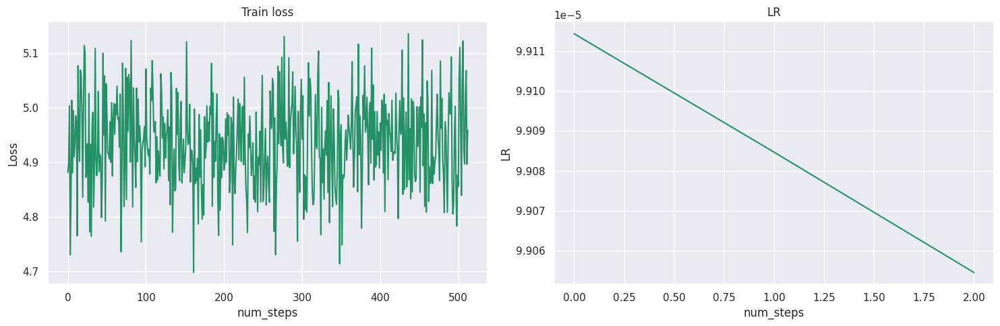

<Figure size 640x480 with 0 Axes>

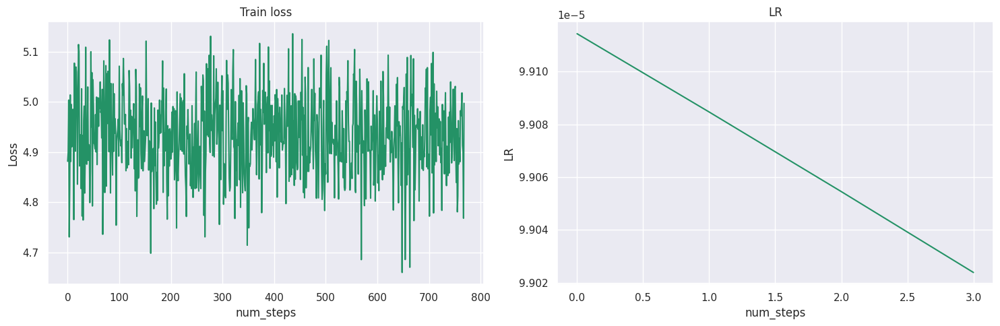

<Figure size 640x480 with 0 Axes>

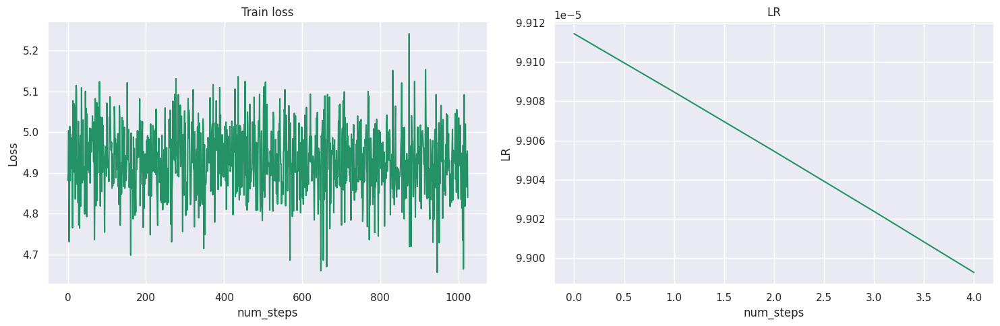

<Figure size 640x480 with 0 Axes>

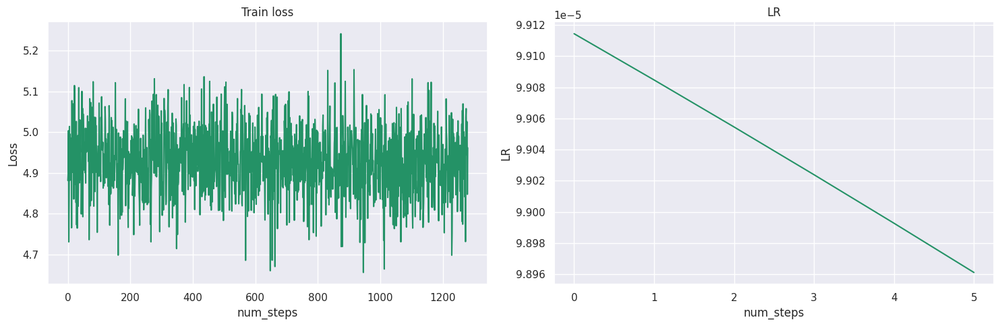

<Figure size 640x480 with 0 Axes>

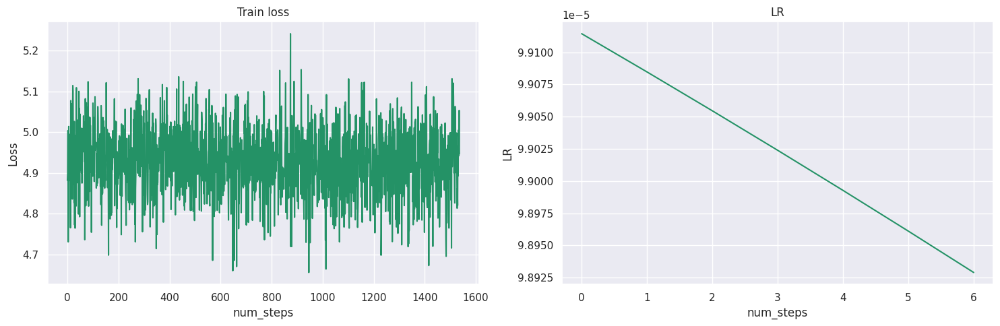

<Figure size 640x480 with 0 Axes>

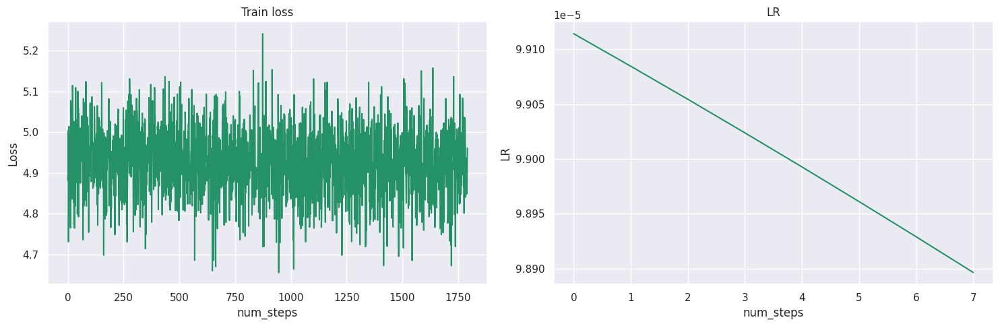

<Figure size 640x480 with 0 Axes>

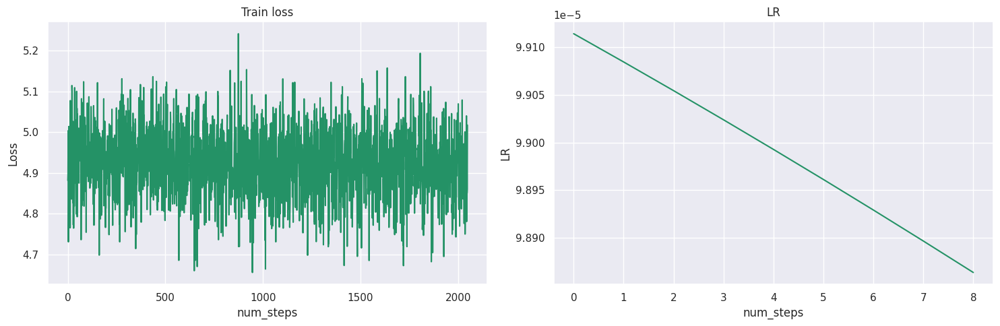

<Figure size 640x480 with 0 Axes>

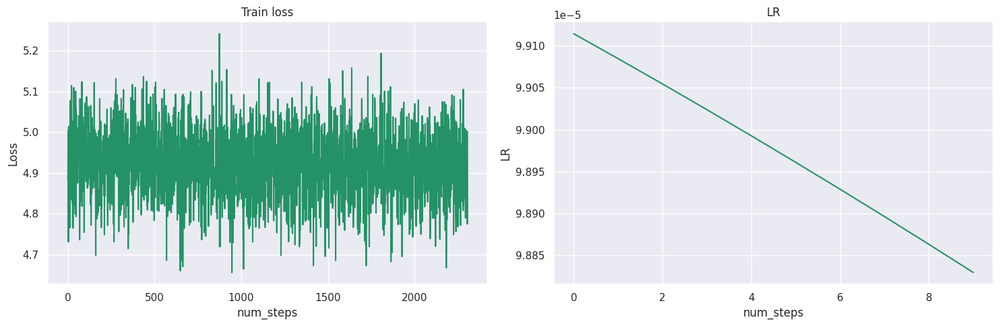

<Figure size 640x480 with 0 Axes>

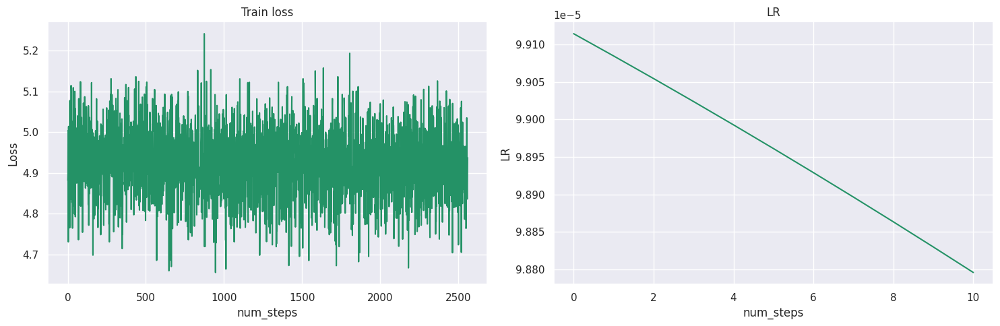

<Figure size 640x480 with 0 Axes>

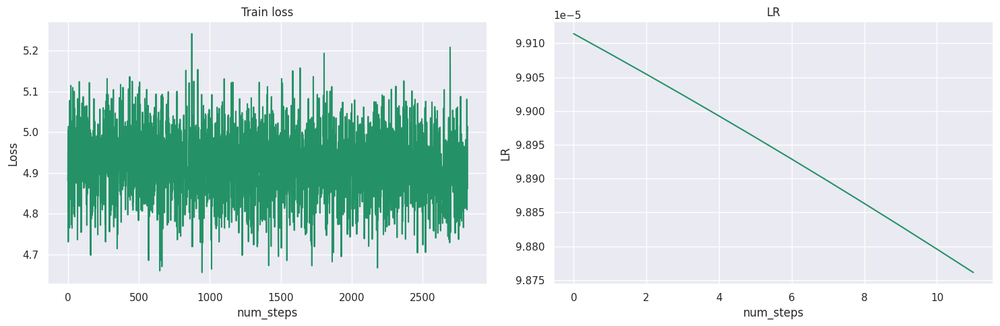

<Figure size 640x480 with 0 Axes>

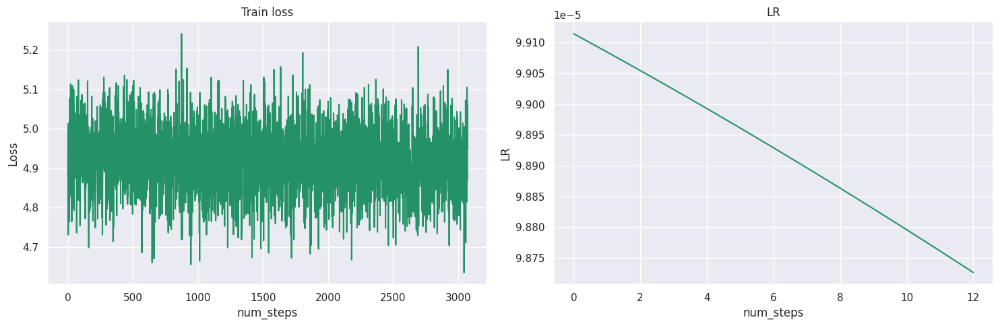

<Figure size 640x480 with 0 Axes>

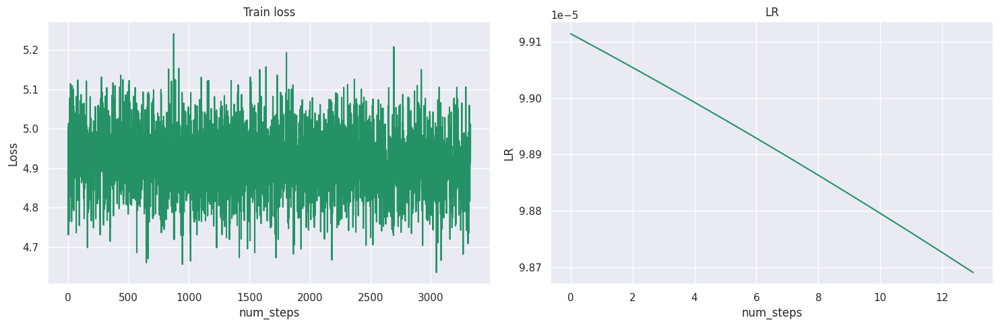

<Figure size 640x480 with 0 Axes>

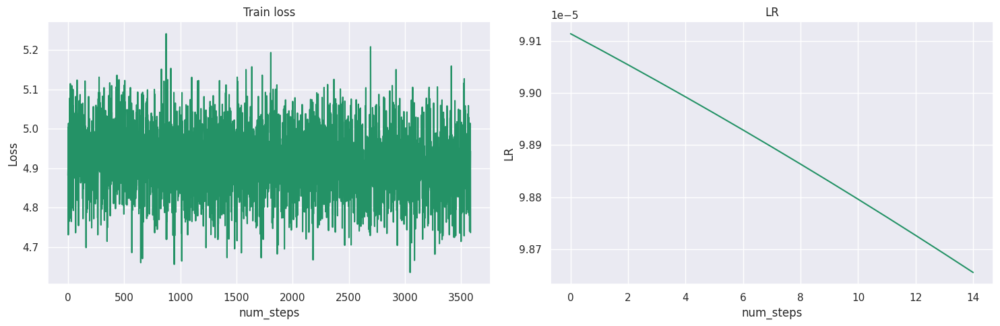

<Figure size 640x480 with 0 Axes>

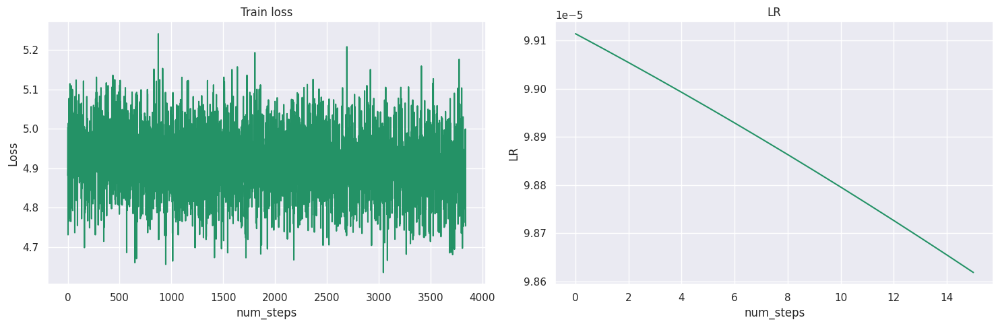

<Figure size 640x480 with 0 Axes>

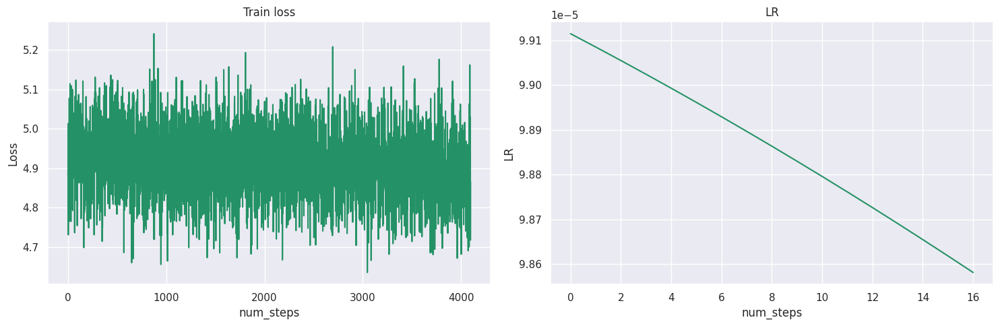

<Figure size 640x480 with 0 Axes>

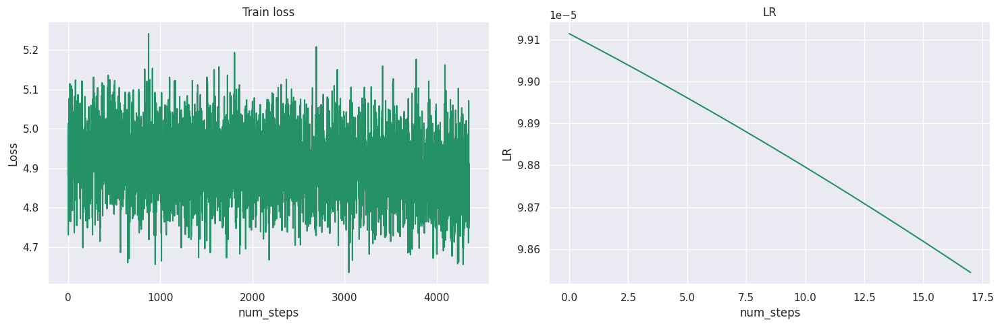

<Figure size 640x480 with 0 Axes>

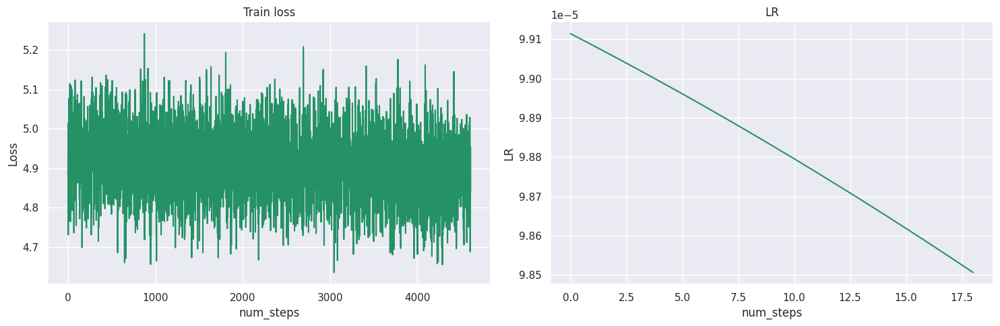

<Figure size 640x480 with 0 Axes>

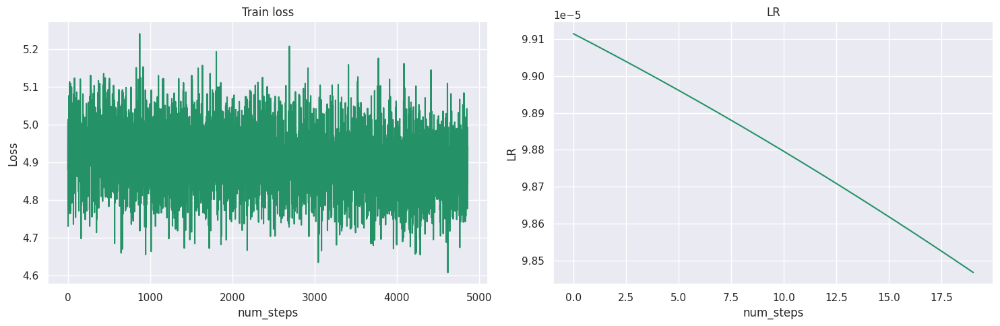

Training epoch 5:   0%|          | 0/4895 [00:00<?, ?it/s]

<Figure size 640x480 with 0 Axes>

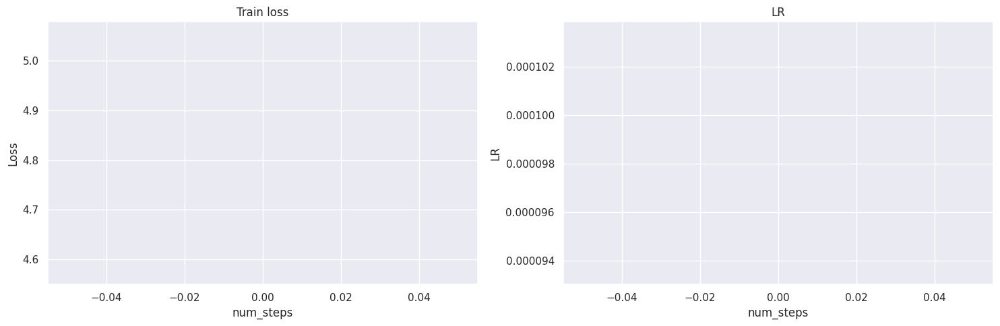

<Figure size 640x480 with 0 Axes>

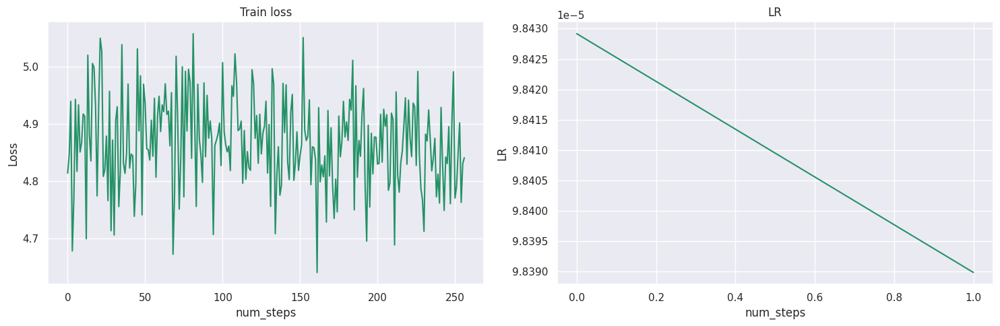

<Figure size 640x480 with 0 Axes>

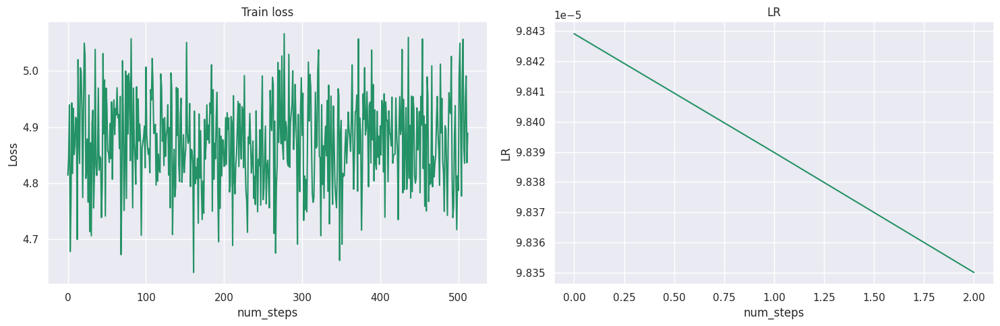

<Figure size 640x480 with 0 Axes>

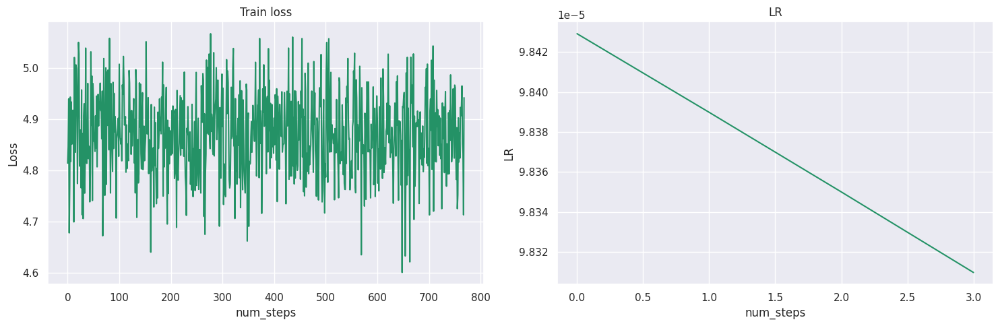

<Figure size 640x480 with 0 Axes>

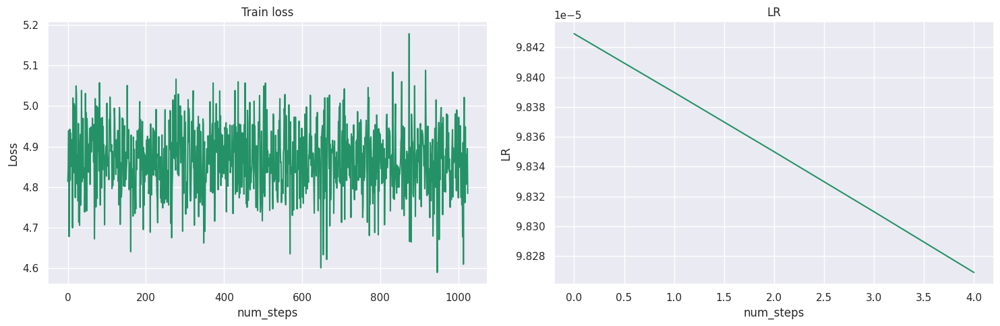

<Figure size 640x480 with 0 Axes>

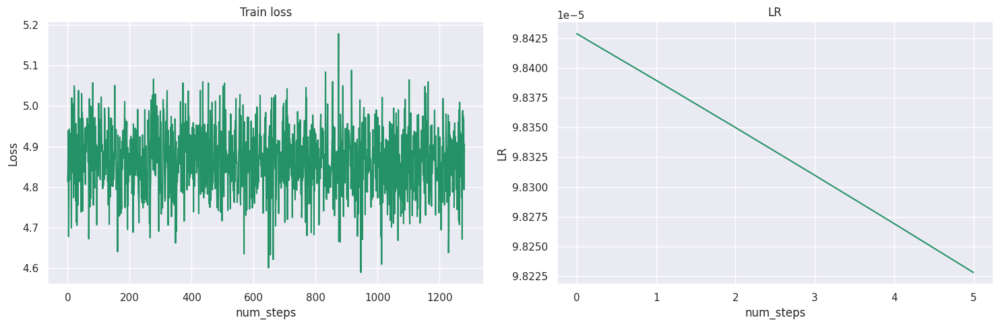

<Figure size 640x480 with 0 Axes>

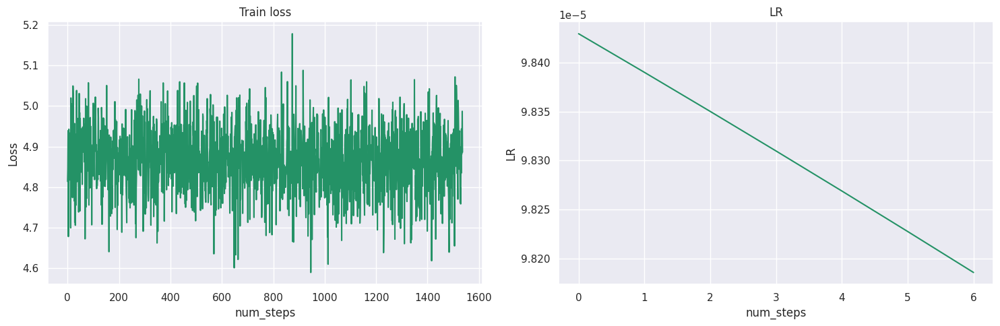

<Figure size 640x480 with 0 Axes>

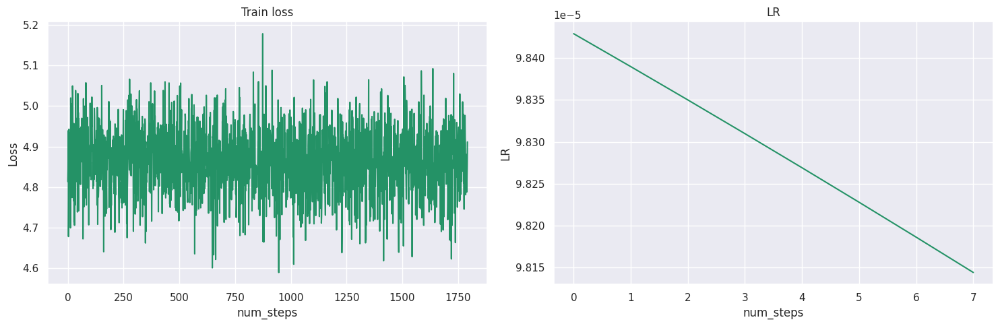

<Figure size 640x480 with 0 Axes>

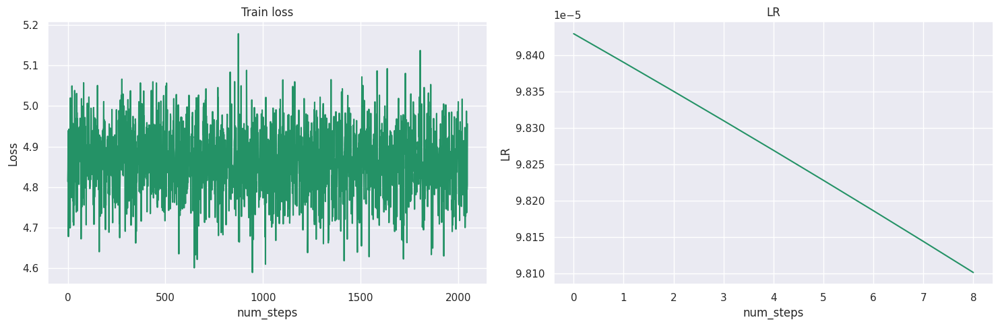

<Figure size 640x480 with 0 Axes>

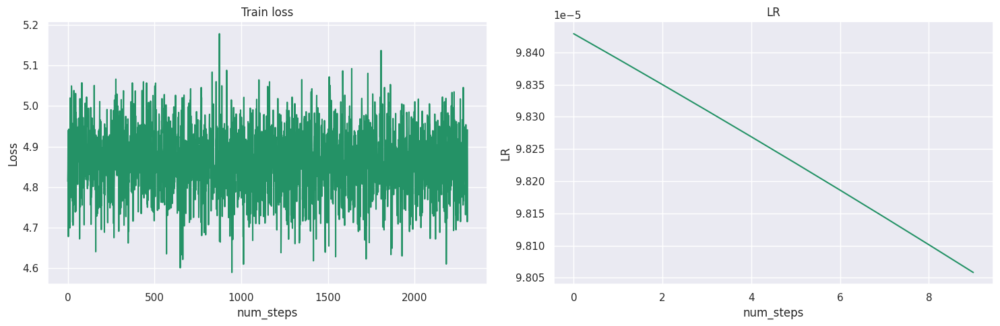

<Figure size 640x480 with 0 Axes>

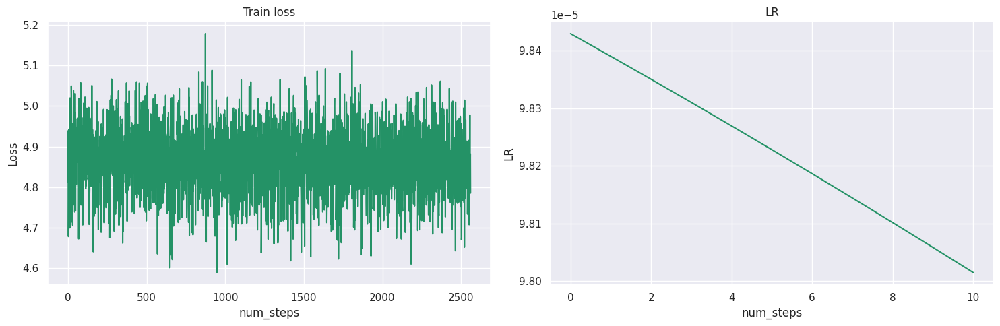

<Figure size 640x480 with 0 Axes>

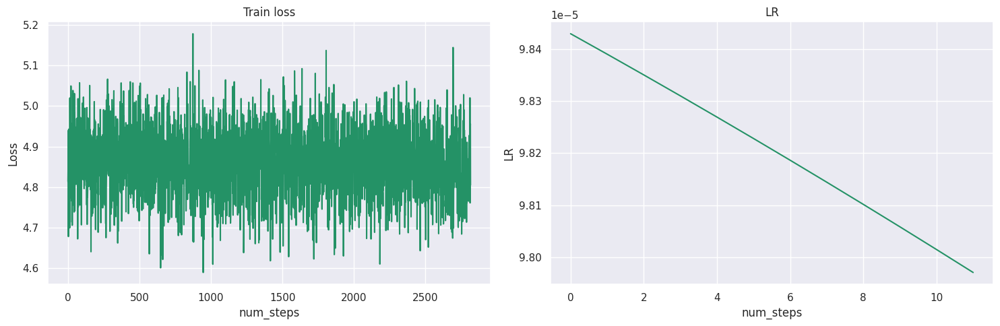

<Figure size 640x480 with 0 Axes>

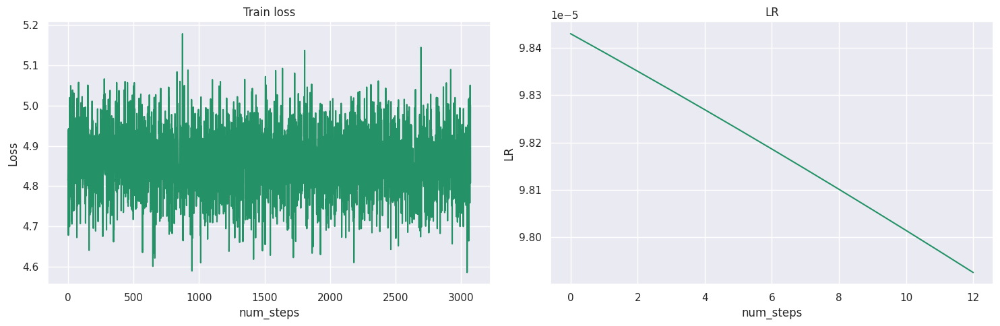

<Figure size 640x480 with 0 Axes>

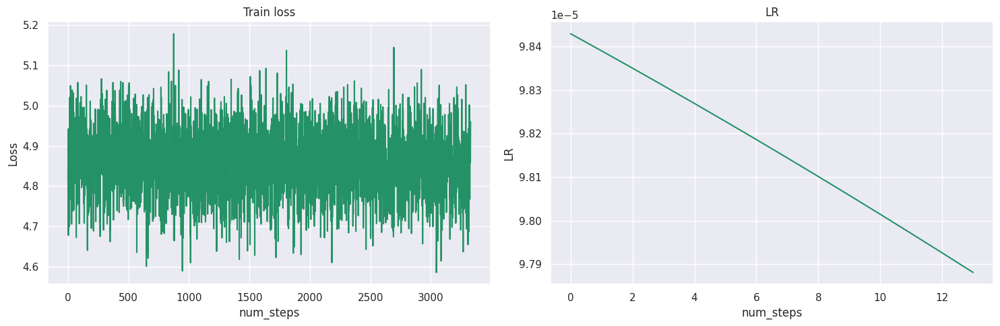

<Figure size 640x480 with 0 Axes>

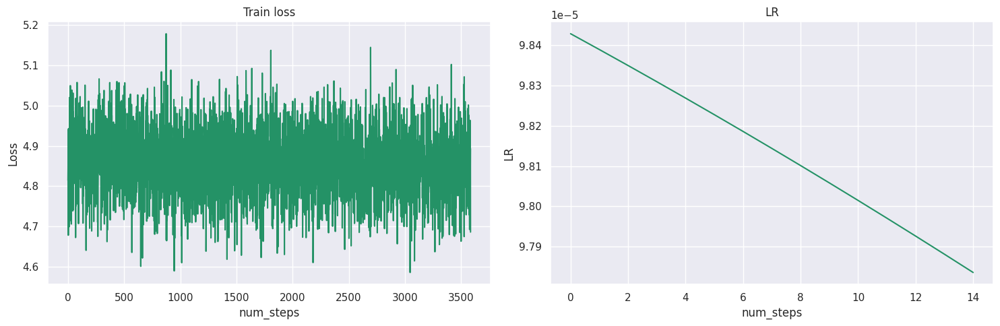

<Figure size 640x480 with 0 Axes>

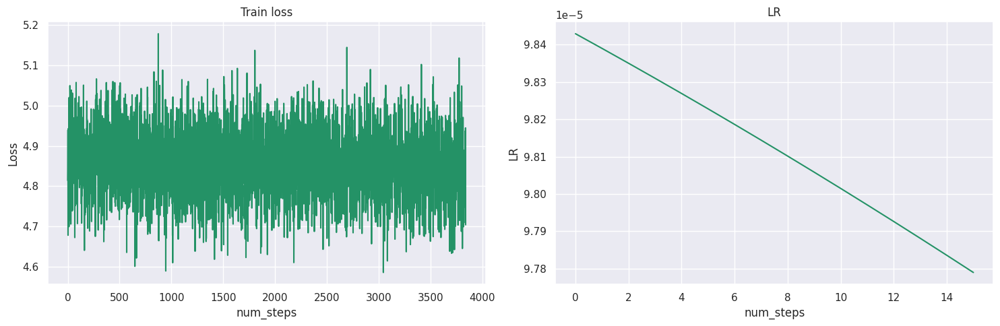

<Figure size 640x480 with 0 Axes>

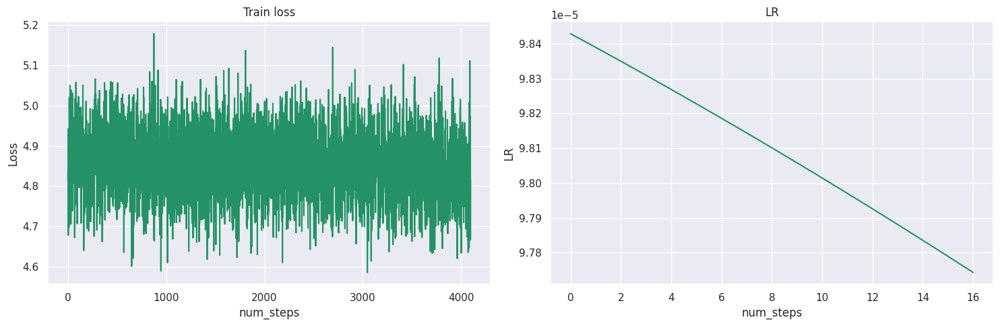

<Figure size 640x480 with 0 Axes>

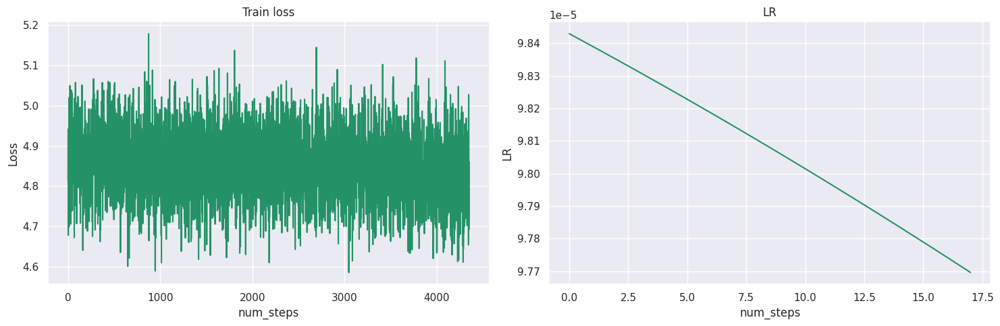

<Figure size 640x480 with 0 Axes>

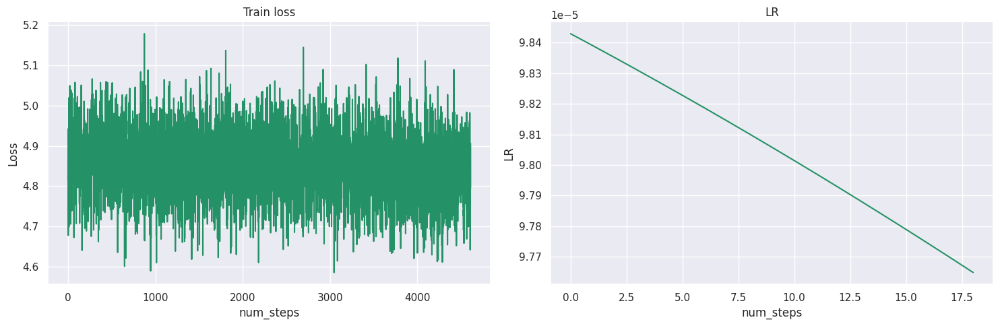

<Figure size 640x480 with 0 Axes>

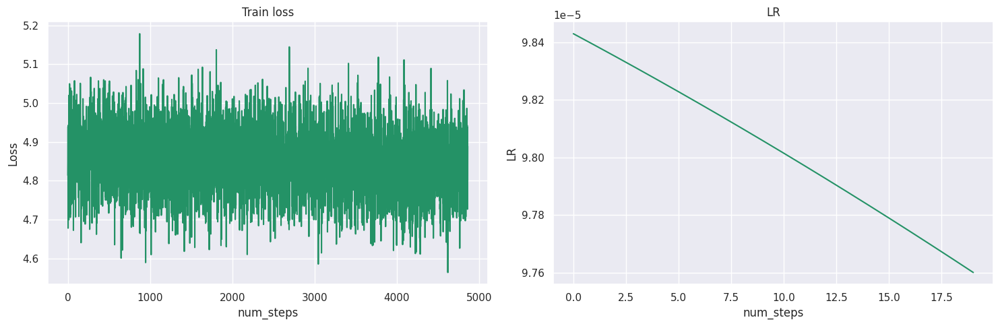

In [201]:
pp_x = train_model(model, criterion, optimizer, scheduler, 5)

In [204]:
pp_x

[180.03376407878935,
 153.45284798987825,
 140.3579892734953,
 132.16861360218837,
 126.5968607253754]

In [205]:
evaluate(model, criterion, test_dataloader)

126.45987314584015

### Второй эксперимент (2 балла)

Попробуйте что-то поменять в модели или в пайплайне обучения, идеи для экспериментов можно подсмотреть выше.

In [206]:
# Проведите второй эксперимент
class LanguageModel_v2(nn.Module):
    def __init__(self, vocab_size, emb_size, hidden_size, fc_size, num_layers):
        super().__init__()
        self.vocab_size = vocab_size
        self.emb_size = emb_size
        self.hidden_size = hidden_size
        self.fc_size = fc_size
        self.num_layers = num_layers
        
        
        self.emb = nn.Embedding(self.vocab_size, self.emb_size)
        self.LSTM = nn.LSTM(self.emb_size, self.hidden_size, num_layers=self.num_layers)
        # Опишите свою нейронную сеть здесь
        self.fc = nn.Sequential(OrderedDict([
            ('lin1', nn.Linear(self.hidden_size, self.fc_size)),
            ('activation', nn.ReLU()),
            ('lin2', nn.Linear(self.fc_size, self.vocab_size))
        ]))
    def forward(self, input_batch: torch.Tensor) -> torch.Tensor:
        embeds = self.emb(input_batch)
        features = self.LSTM(embeds)[0]

        result = self.fc(features)
        return result


In [220]:
# Обучите модель здесь

model_new = LanguageModel_v2(len(vocab), 300, 300, 800, num_layers=2).to(device)
optimizer = torch.optim.AdamW(model_new.parameters(), lr=1e-3)
criterion = nn.CrossEntropyLoss(ignore_index=word2ind['<pad>'])
scheduler = CosineAnnealingLR(optimizer, T_max=1000)

Training epoch 1:   0%|          | 0/4895 [00:00<?, ?it/s]

<Figure size 640x480 with 0 Axes>

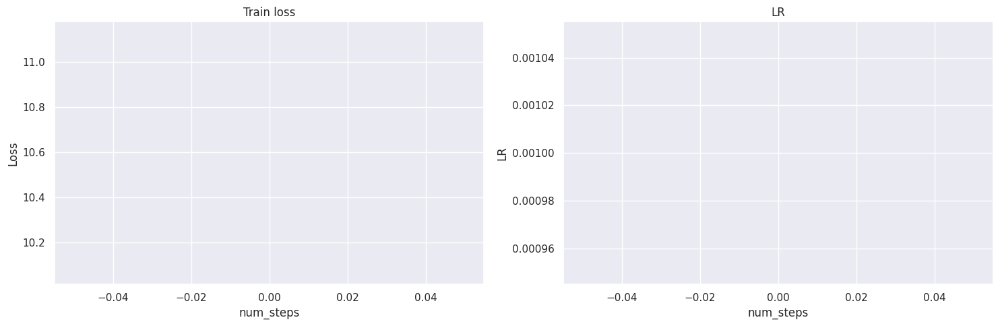

<Figure size 640x480 with 0 Axes>

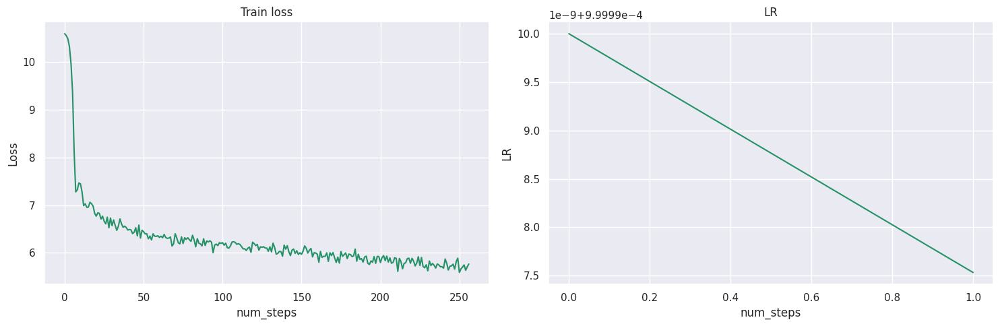

<Figure size 640x480 with 0 Axes>

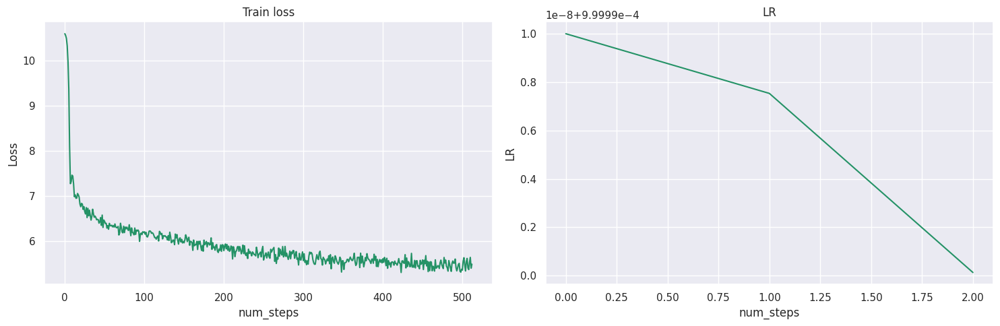

<Figure size 640x480 with 0 Axes>

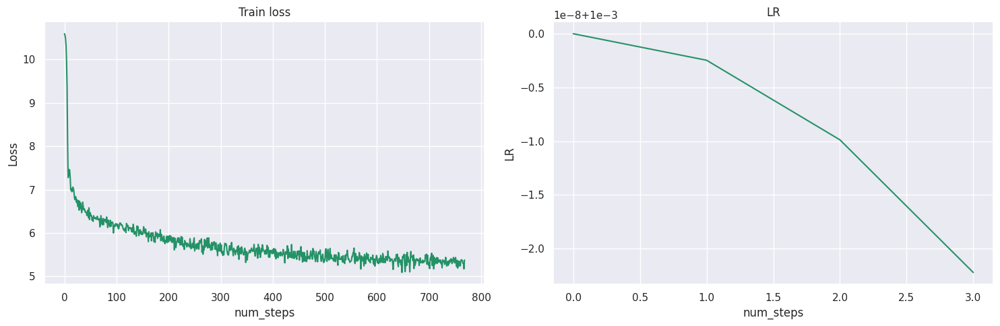

<Figure size 640x480 with 0 Axes>

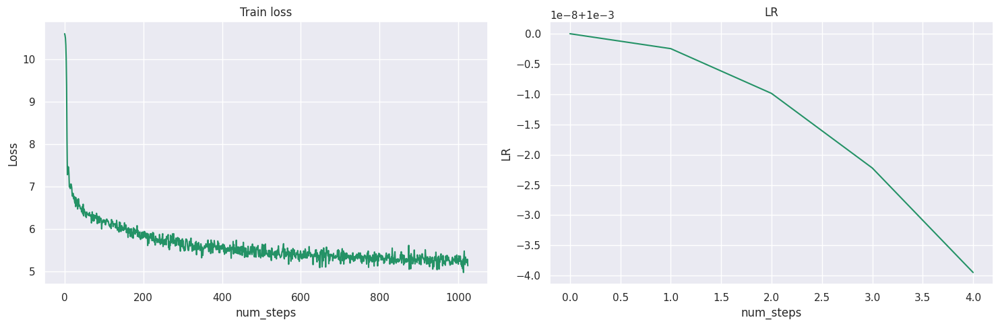

<Figure size 640x480 with 0 Axes>

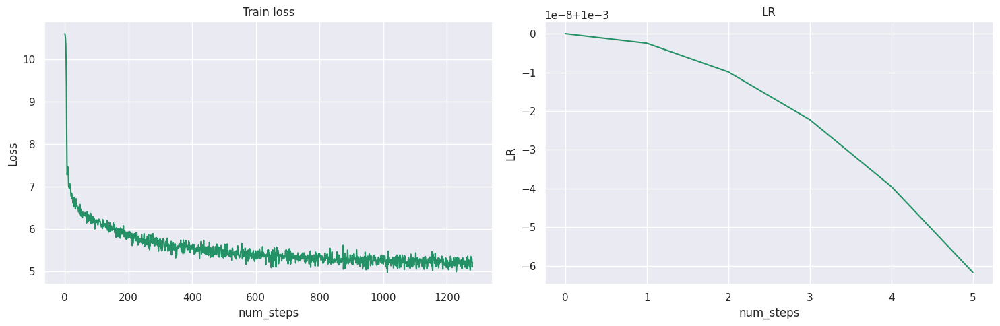

<Figure size 640x480 with 0 Axes>

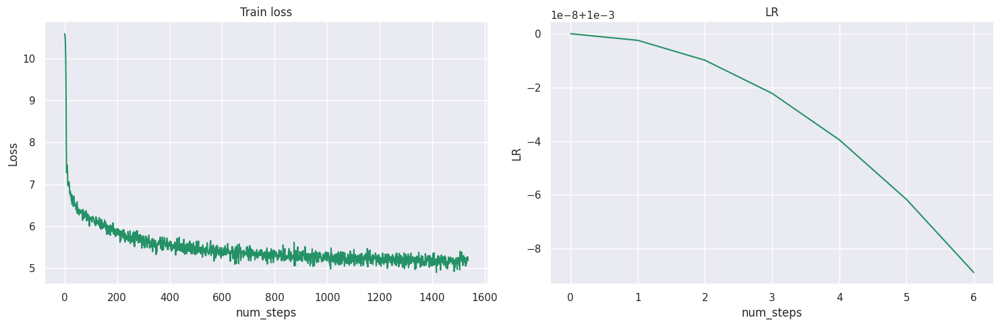

<Figure size 640x480 with 0 Axes>

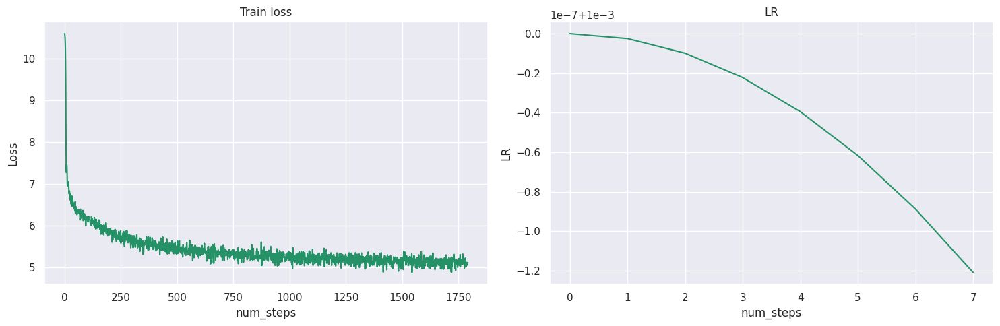

<Figure size 640x480 with 0 Axes>

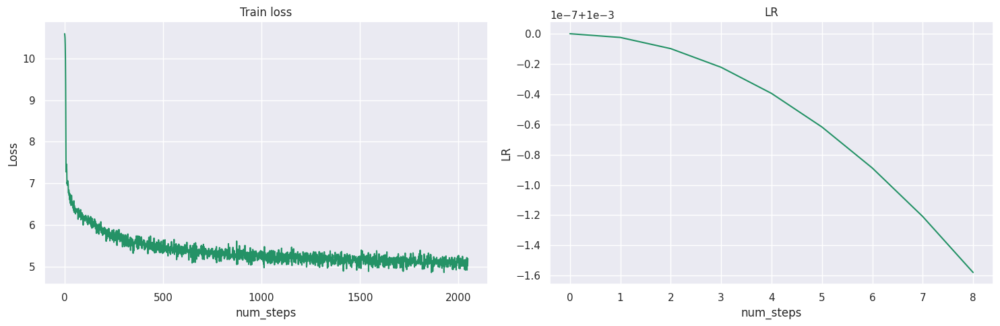

<Figure size 640x480 with 0 Axes>

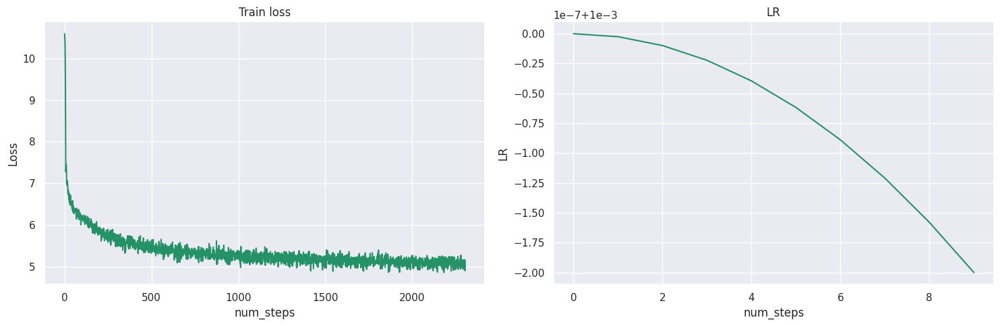

<Figure size 640x480 with 0 Axes>

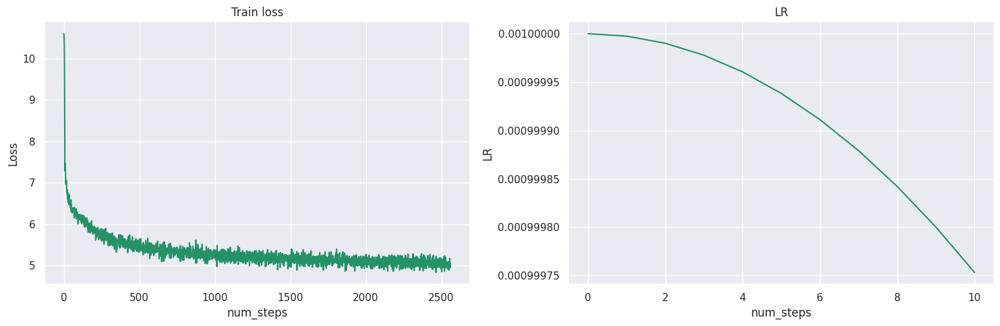

<Figure size 640x480 with 0 Axes>

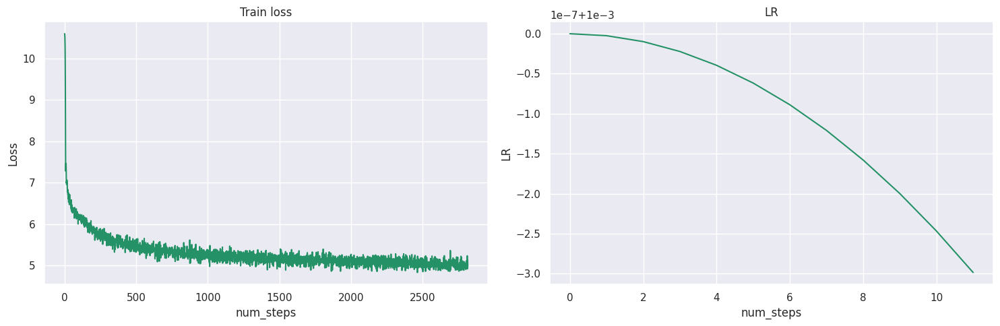

<Figure size 640x480 with 0 Axes>

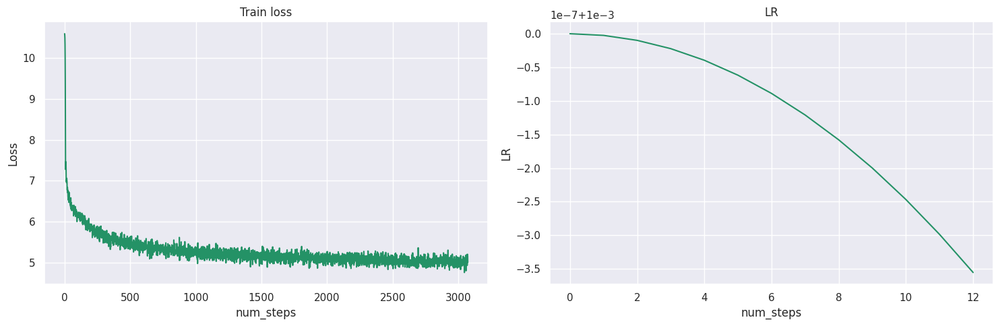

<Figure size 640x480 with 0 Axes>

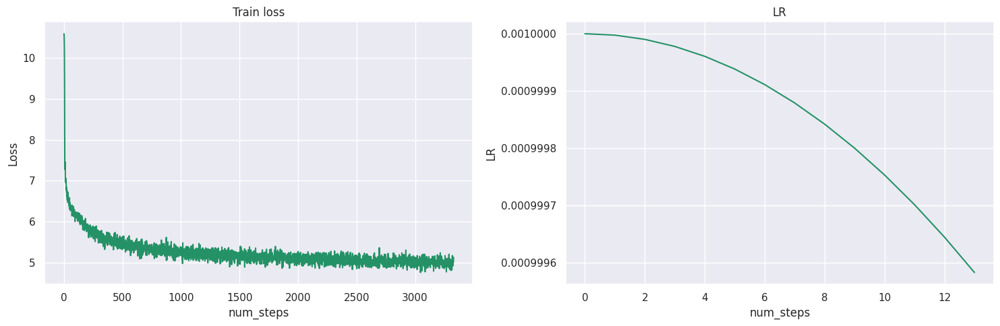

<Figure size 640x480 with 0 Axes>

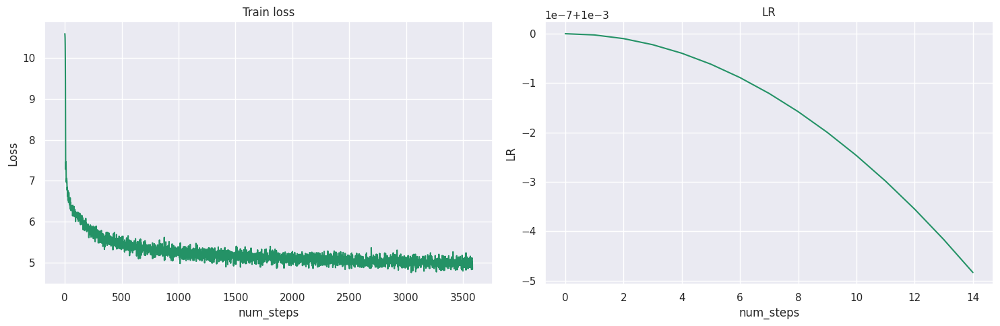

<Figure size 640x480 with 0 Axes>

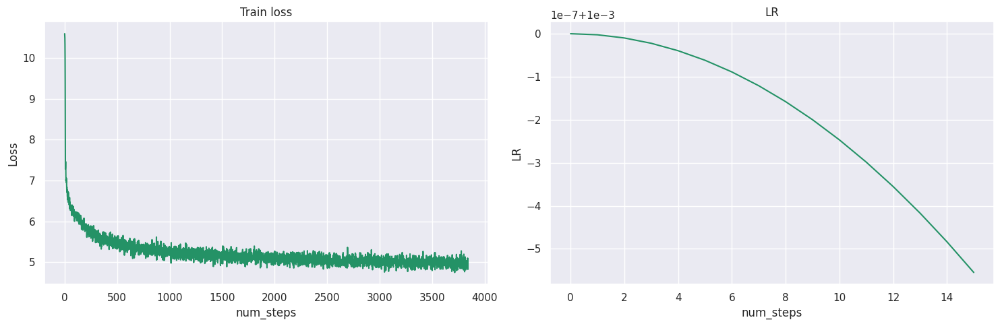

<Figure size 640x480 with 0 Axes>

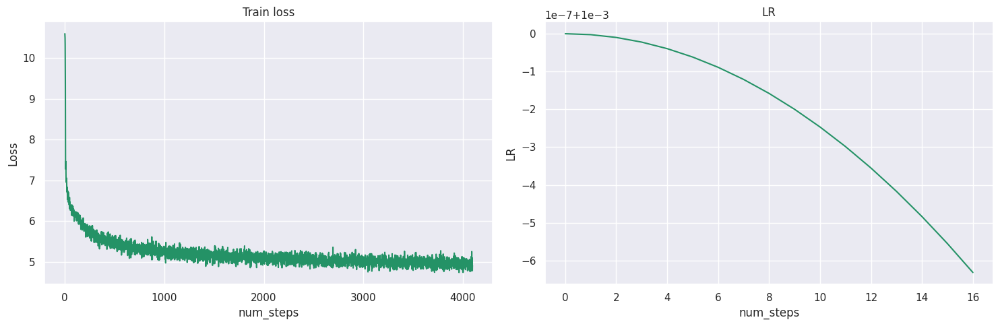

<Figure size 640x480 with 0 Axes>

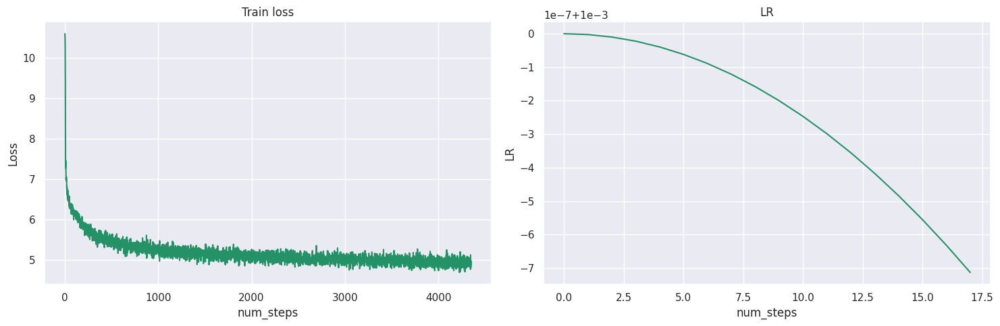

<Figure size 640x480 with 0 Axes>

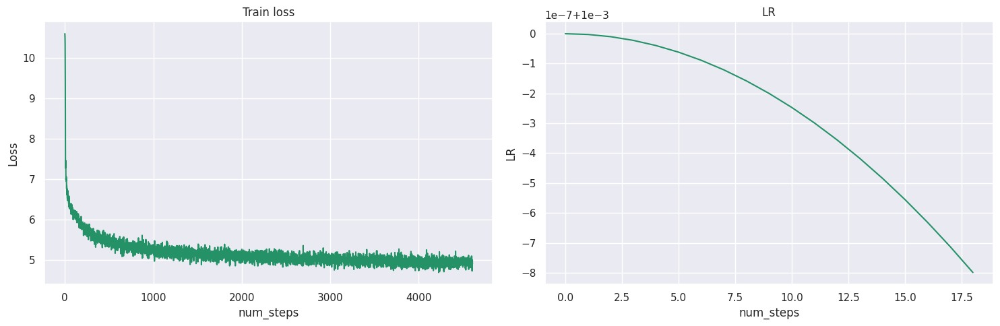

<Figure size 640x480 with 0 Axes>

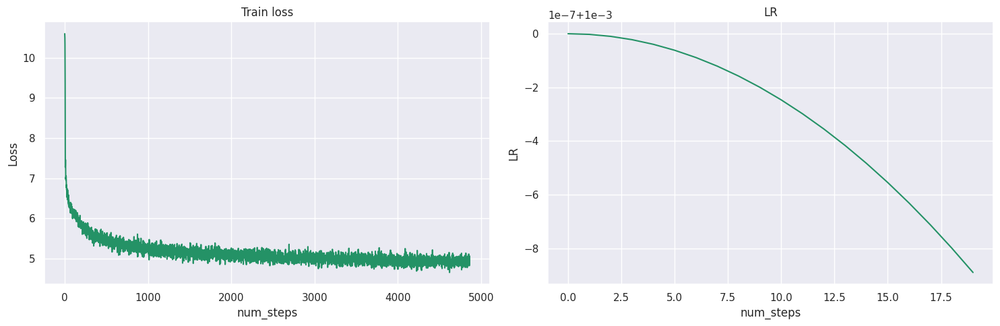

Training epoch 2:   0%|          | 0/4895 [00:00<?, ?it/s]

<Figure size 640x480 with 0 Axes>

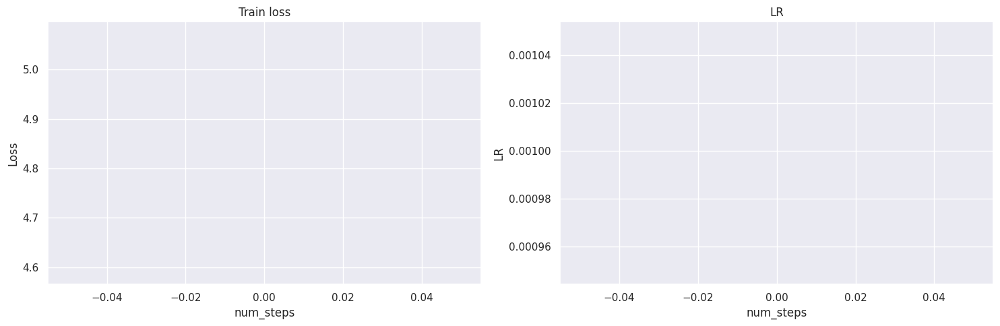

<Figure size 640x480 with 0 Axes>

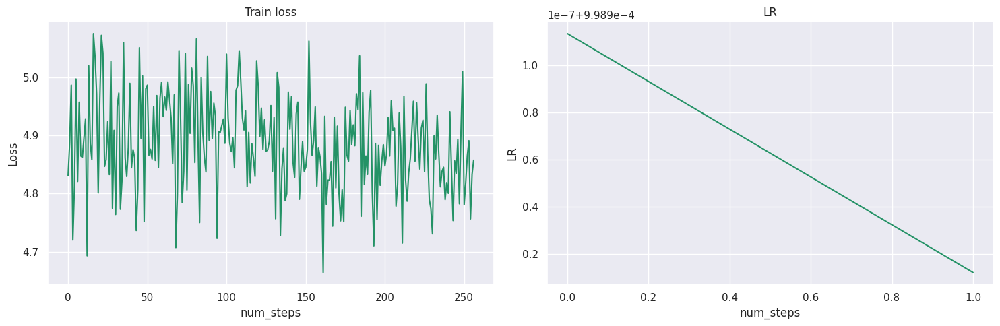

<Figure size 640x480 with 0 Axes>

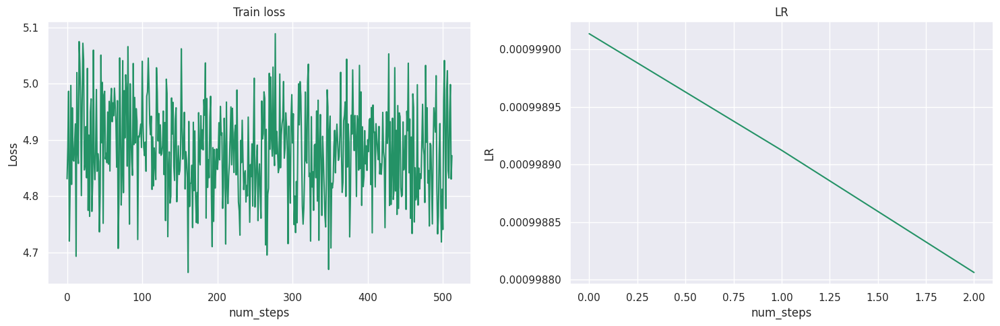

<Figure size 640x480 with 0 Axes>

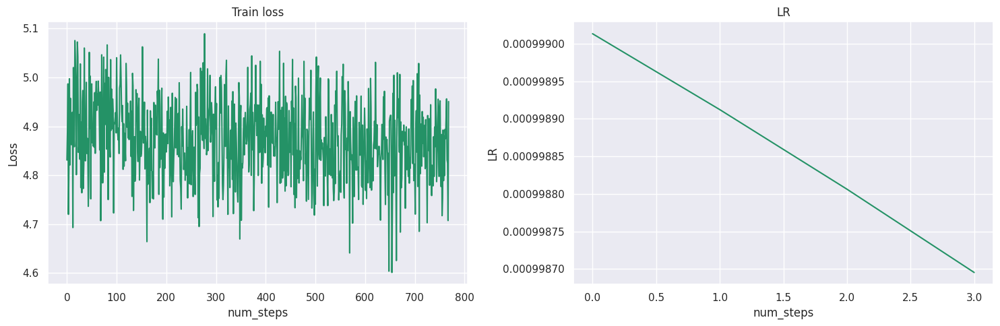

<Figure size 640x480 with 0 Axes>

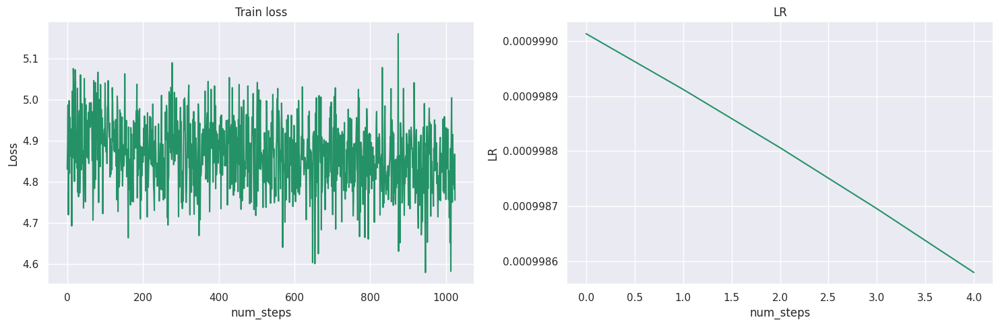

<Figure size 640x480 with 0 Axes>

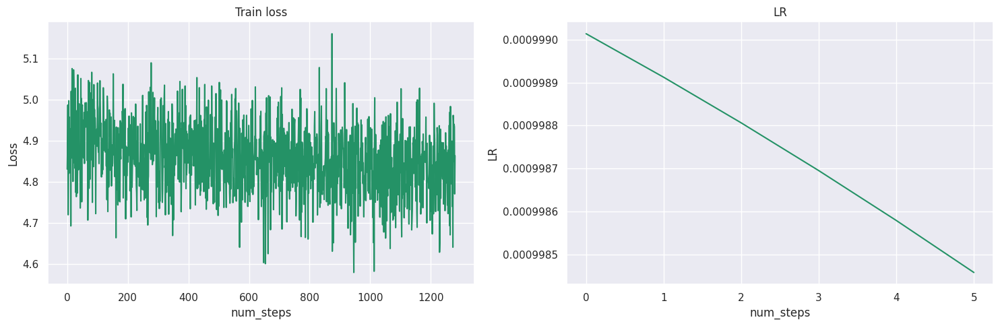

<Figure size 640x480 with 0 Axes>

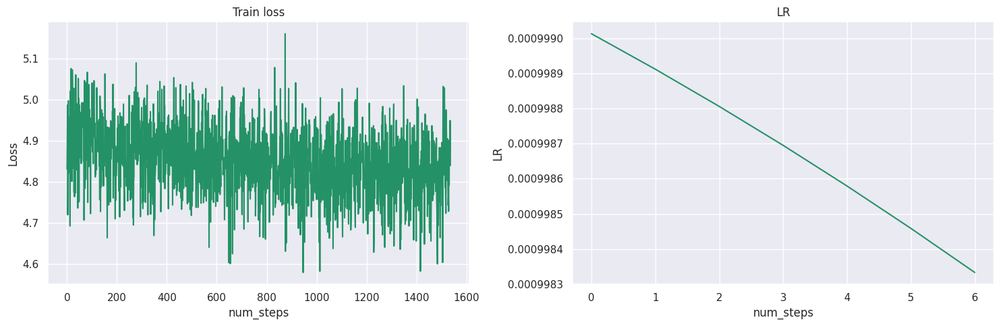

<Figure size 640x480 with 0 Axes>

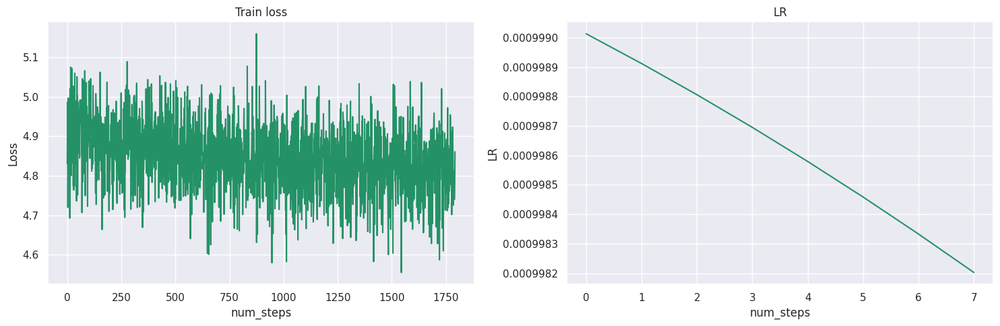

<Figure size 640x480 with 0 Axes>

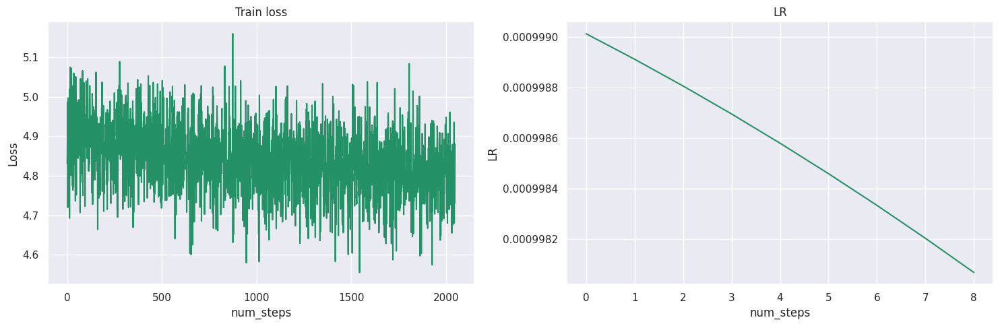

<Figure size 640x480 with 0 Axes>

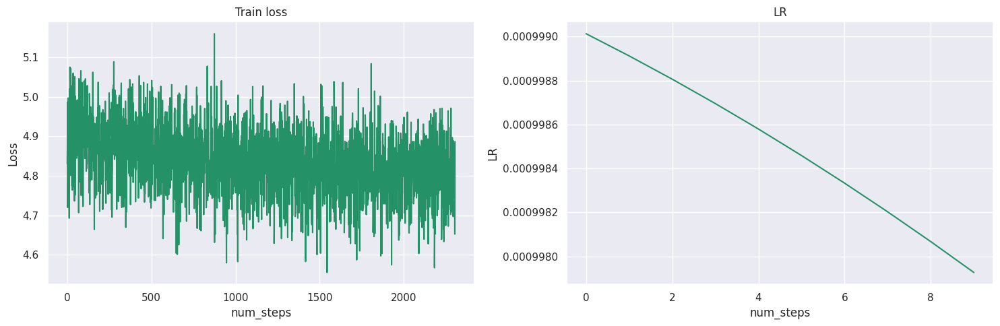

<Figure size 640x480 with 0 Axes>

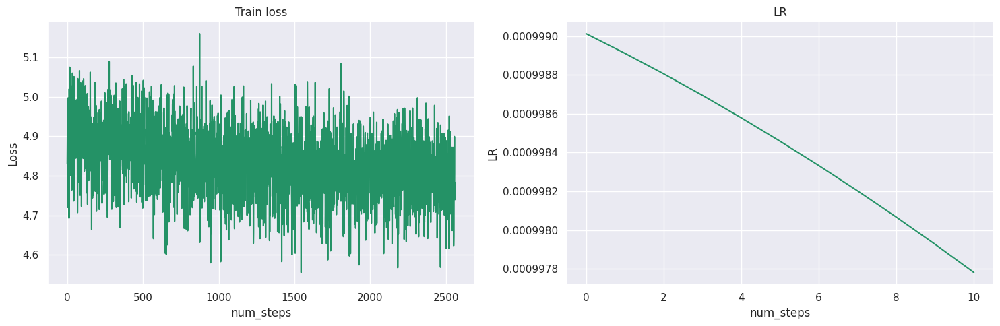

<Figure size 640x480 with 0 Axes>

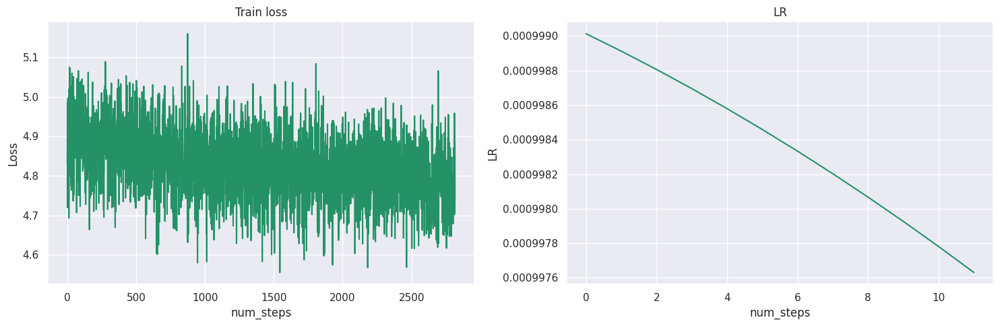

<Figure size 640x480 with 0 Axes>

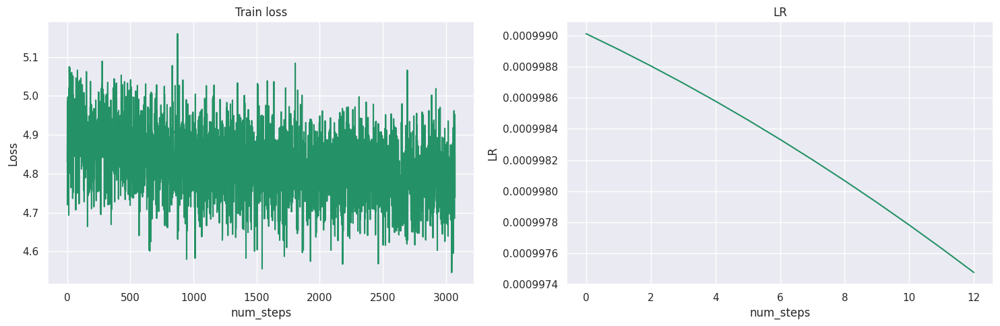

<Figure size 640x480 with 0 Axes>

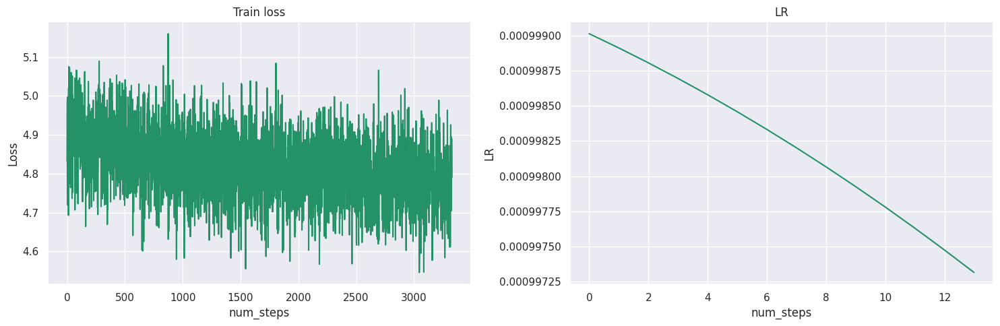

<Figure size 640x480 with 0 Axes>

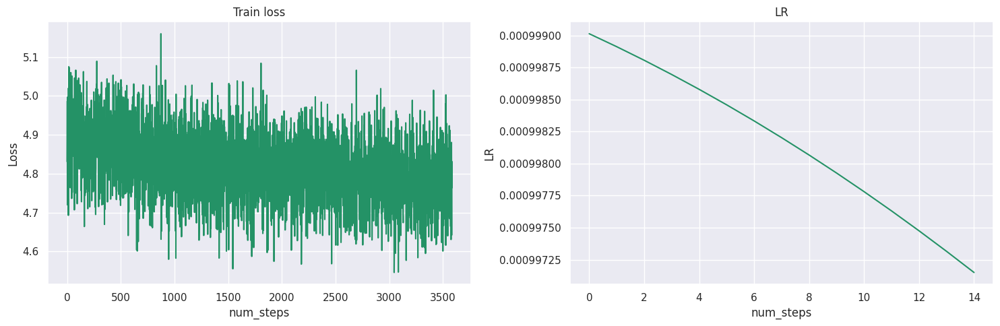

<Figure size 640x480 with 0 Axes>

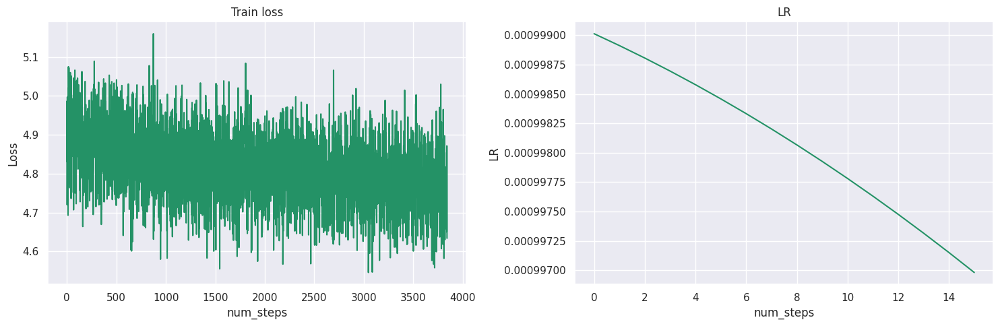

<Figure size 640x480 with 0 Axes>

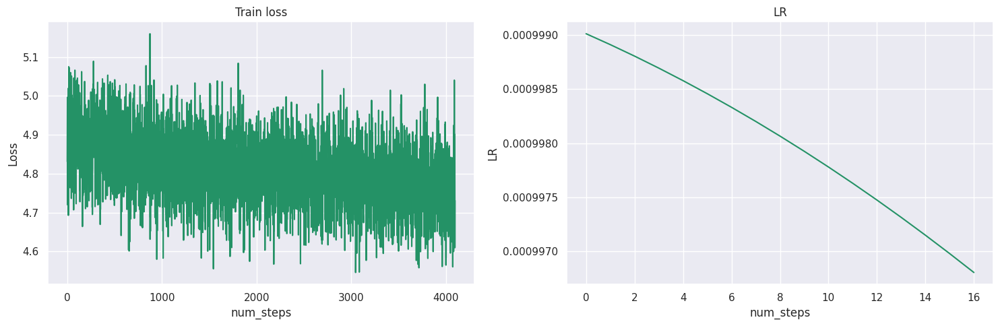

<Figure size 640x480 with 0 Axes>

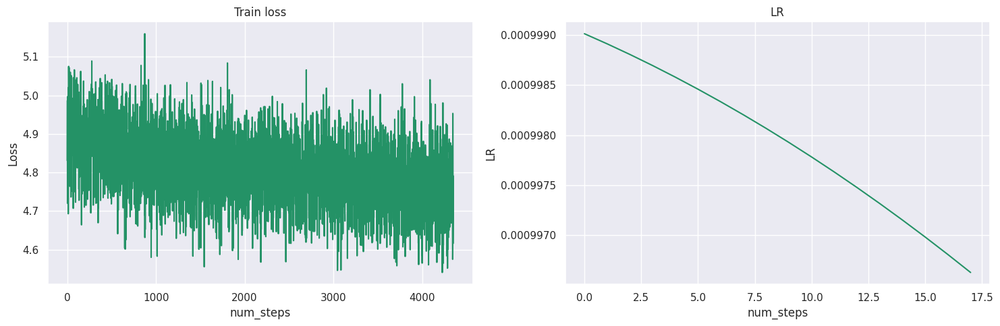

<Figure size 640x480 with 0 Axes>

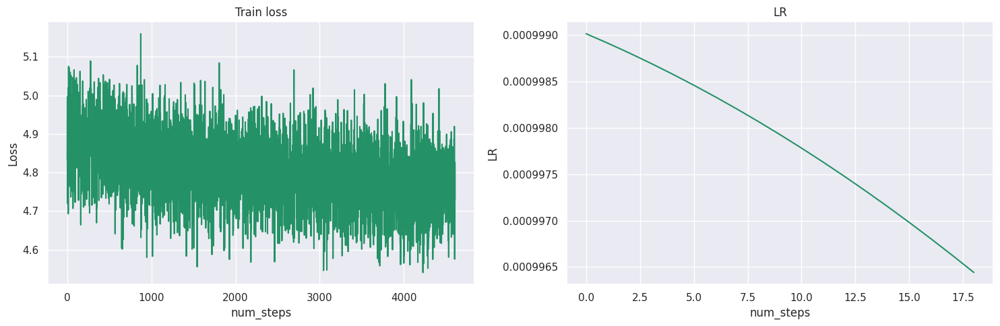

<Figure size 640x480 with 0 Axes>

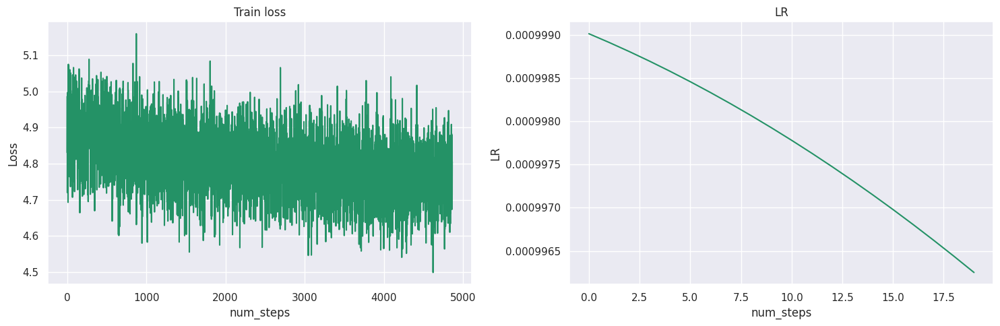

In [221]:
pp_x_v2 = train_model(model_new, criterion, optimizer, scheduler, 2)

In [222]:
evaluate(model_new, criterion, test_dataloader)

116.59673628069756

### Отчет (2 балла)

Опишите проведенные эксперименты. Сравните перплексии полученных моделей. Предложите идеи по улучшению качества моделей.

Эксперимент первый - взять LSTM и полносвязную сеть с внутренней размерностью 600. Модель обучается, лучшее pp_x - 126 после 5 эпох. 

Эксперимент второй - взять LSTM с 2 слоями и полносвязную сеть с внутренней размерностью 800. Модель обучается, лучшее pp_x - 126 после 2 эпох. 

Один из способов улучшения - увеличить количество эпох, так же можно попробовать исопльзовать другую архитектуру, например attention.